In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import warnings
warnings.filterwarnings('ignore')

plt.rcParams['figure.dpi'] = 120
plt.rcParams['font.size'] = 10
sns.set_style('whitegrid')

In [2]:
# Data loading
PATH = r'C:\\Users\\avni\\Masaüstü\\cse555-sda\\CustomerSegmentation\\CC GENERAL.csv'
df_raw = pd.read_csv(PATH)

print(f'Size   : {df_raw.shape}')
print(f'Columns: {list(df_raw.columns)}')
df_raw.head()

Size   : (8950, 18)
Columns: ['CUST_ID', 'BALANCE', 'BALANCE_FREQUENCY', 'PURCHASES', 'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE', 'PURCHASES_FREQUENCY', 'ONEOFF_PURCHASES_FREQUENCY', 'PURCHASES_INSTALLMENTS_FREQUENCY', 'CASH_ADVANCE_FREQUENCY', 'CASH_ADVANCE_TRX', 'PURCHASES_TRX', 'CREDIT_LIMIT', 'PAYMENTS', 'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT', 'TENURE']


,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


In [3]:
# Missing value report
missing = df_raw.isnull().sum()
missing_pct = (missing / len(df_raw) * 100).round(2)
pd.DataFrame({'Missing Count': missing, 'Percentage (%)': missing_pct})[missing > 0]

,Missing Count,Percentage (%)
CREDIT_LIMIT,1,0.01
MINIMUM_PAYMENTS,313,3.50


In [4]:
# CUST_ID dropped, missing values filled with median
df = df_raw.drop(columns=['CUST_ID']).copy()

for col in df.columns:
    if df[col].isnull().sum() > 0:
        median_val = df[col].median()
        df[col].fillna(median_val, inplace=True)
        print(f'{col}: {df_raw[col].isnull().sum()} missing → median ({median_val:.4f}) filled')

print(f'\nRemaining missing: {df.isnull().sum().sum()}')

CREDIT_LIMIT: 1 missing → median (3000.0000) filled
MINIMUM_PAYMENTS: 313 missing → median (312.3439) filled

Remaining missing: 314


NaN count before fit: 314
NaN count after cleaning: 0


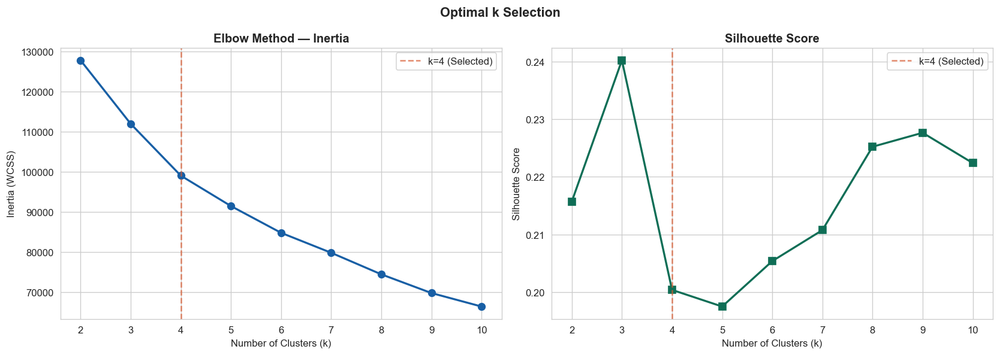

In [5]:
# Finding optimal k with Elbow + Silhouette 

# --- Safe NaN cleaning (so it can run independently across cells) ---
print(f"NaN count before fit: {df.isnull().sum().sum()}")
for col in df.columns:
    if df[col].isnull().sum() > 0:
        df[col] = df[col].fillna(df[col].median())
print(f"NaN count after cleaning: {df.isnull().sum().sum()}")

# --- Get only numerical columns for Elbow (CLASS is not included yet) ---
feature_cols = [c for c in df.columns if c != 'CLASS']
scaler_elbow = StandardScaler()
X_scaled     = scaler_elbow.fit_transform(df[feature_cols])

inertia_vals    = []
silhouette_vals = []
k_range         = range(2, 11)

for k in k_range:
    km  = KMeans(n_clusters=k, random_state=42, n_init=10)
    km.fit(X_scaled)
    inertia_vals.append(km.inertia_)
    sil = silhouette_score(X_scaled, km.labels_, sample_size=2000, random_state=42)
    silhouette_vals.append(sil)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].plot(k_range, inertia_vals, 'o-', color='#185FA5', linewidth=2, markersize=7)
axes[0].axvline(x=4, color='#D85A30', linestyle='--', alpha=0.7, label='k=4 (Selected)')
axes[0].set_title('Elbow Method — Inertia', fontweight='bold')
axes[0].set_xlabel('Number of Clusters (k)')
axes[0].set_ylabel('Inertia (WCSS)')
axes[0].legend()

axes[1].plot(k_range, silhouette_vals, 's-', color='#0F6E56', linewidth=2, markersize=7)
axes[1].axvline(x=4, color='#D85A30', linestyle='--', alpha=0.7, label='k=4 (Selected)')
axes[1].set_title('Silhouette Score', fontweight='bold')
axes[1].set_xlabel('Number of Clusters (k)')
axes[1].set_ylabel('Silhouette Score')
axes[1].legend()

plt.suptitle('Optimal k Selection', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()

In [6]:
##### COMMENTS ON THE RESULTS #####

### The Elbow Method calculates the sum of squared distances from each data point to its assigned cluster center.
### In other words, it shows how tight or compact the clusters are. 
### The point where adding another cluster does not give a significant benefit is called the "elbow," and we can choose that point as our k value.
      
### The Silhouette Score compares two things for each data point:
### The average distance to other points within its own cluster.
### The average distance to points in the nearest neighboring cluster.
### The difference than elbow method is it makes its peak on the probable optimal k.
### In this case,eventhough Silhouette Score shows 3 is more optimal for k value, k=4 might be a better choice due to elbow methods more discrete value as 3.


#####

Class distribution:
  Class 0: 3977 samples  (44.4%)
  Class 1: 409 samples  (4.6%)
  Class 2: 1197 samples  (13.4%)
  Class 3: 3367 samples  (37.6%)


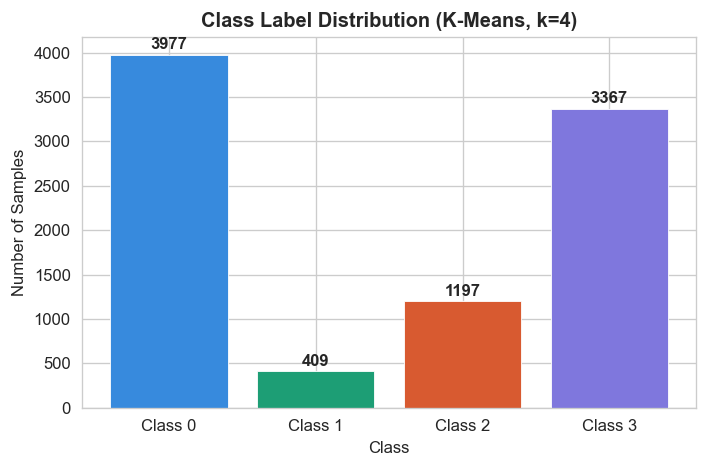

In [7]:
# K-Means with k=4 class labels
N_CLUSTERS = 4
kmeans_final    = KMeans(n_clusters=N_CLUSTERS, random_state=42, n_init=10)
df['CLASS']     = kmeans_final.fit_predict(X_scaled)

cluster_dist = df['CLASS'].value_counts().sort_index()
print('Class distribution:')
for cls, cnt in cluster_dist.items():
    print(f'  Class {cls}: {cnt} samples  ({cnt/len(df)*100:.1f}%)')

colors_cluster = ['#378ADD', '#1D9E75', '#D85A30', '#7F77DD']
fig, ax = plt.subplots(figsize=(6, 4))
bars = ax.bar(cluster_dist.index, cluster_dist.values, color=colors_cluster,
              edgecolor='white', linewidth=0.5)
for bar, val in zip(bars, cluster_dist.values):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 30,
            str(val), ha='center', va='bottom', fontsize=10, fontweight='bold')
ax.set_title('Class Label Distribution (K-Means, k=4)', fontweight='bold')
ax.set_xlabel('Class')
ax.set_ylabel('Number of Samples')
ax.set_xticks([0, 1, 2, 3])
ax.set_xticklabels(['Class 0', 'Class 1', 'Class 2', 'Class 3'])
plt.tight_layout()
plt.show()

In [8]:
FEATURES = [c for c in df.columns if c != 'CLASS']
print(f'Features Amount: {len(FEATURES)}')
print(FEATURES)

Features Amount: 17
['BALANCE', 'BALANCE_FREQUENCY', 'PURCHASES', 'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE', 'PURCHASES_FREQUENCY', 'ONEOFF_PURCHASES_FREQUENCY', 'PURCHASES_INSTALLMENTS_FREQUENCY', 'CASH_ADVANCE_FREQUENCY', 'CASH_ADVANCE_TRX', 'PURCHASES_TRX', 'CREDIT_LIMIT', 'PAYMENTS', 'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT', 'TENURE']


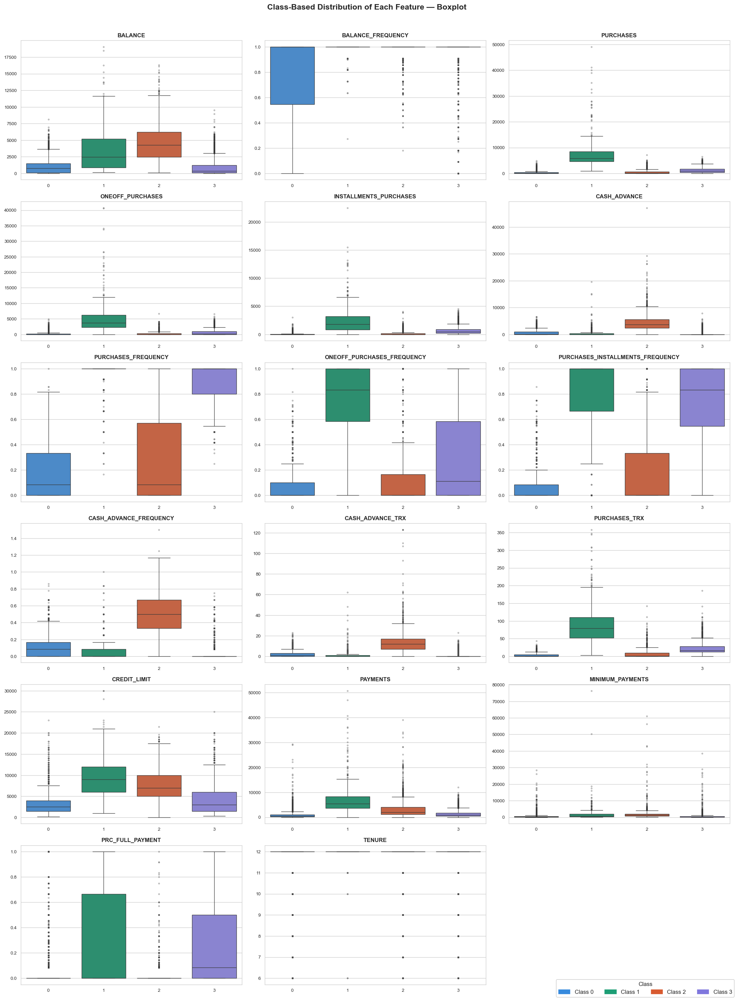

In [9]:
palette = ['#378ADD', '#1D9E75', '#D85A30', '#7F77DD']

fig, axes = plt.subplots(6, 3, figsize=(18, 24))
axes = axes.flatten()

for idx, feat in enumerate(FEATURES):
    ax = axes[idx]
    sns.boxplot(
        data=df,
        x='CLASS',
        y=feat,
        palette=palette,
        ax=ax,
        linewidth=0.8,
        flierprops=dict(marker='o', markersize=2, alpha=0.4, color='gray')
    )
    ax.set_title(feat, fontweight='bold', fontsize=10)
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.tick_params(labelsize=8)

# Hide the last empty cell (17 features, 18 cells)
axes[17].set_visible(False)

legend_patches = [mpatches.Patch(color=palette[i], label=f'Class {i}') for i in range(4)]
fig.legend(handles=legend_patches, loc='lower right', ncol=4,
           fontsize=10, title='Class', framealpha=0.9)

fig.suptitle('Class-Based Distribution of Each Feature — Boxplot',
             fontsize=14, fontweight='bold', y=1.01)
plt.tight_layout()
plt.show()

In [10]:
##### COMMENTS ON THE RESULTS #####

### The box plots above demonstrate that the classes differ distinctly, particularly along the
### PURCHASES_FREQUENCY, PURCHASES_INSTALLMENTS_FREQUENCY, and PURCHASES axes;
### conversely, variables such as TENURE contribute very little to class separation. 
### The high skewness and heavy presence of outliers in the financial variables make the data 
### cleaning step absolutely essential.

#####

In [11]:
# Skewness & kurtosis Table
skew_kurt = pd.DataFrame({
    'Skewness': df[FEATURES].skew().round(3),
    'Kurtosis' : df[FEATURES].kurtosis().round(3)
}).sort_values('Skewness', ascending=False)

print(skew_kurt.to_string())
print(f'\n|Skewness| > 1 olan özellik sayısı: {(skew_kurt["Skewness"].abs() > 1).sum()}')

                                  Skewness  Kurtosis
MINIMUM_PAYMENTS                    13.852   293.720
ONEOFF_PURCHASES                    10.045   164.188
PURCHASES                            8.144   111.389
INSTALLMENTS_PURCHASES               7.299    96.575
PAYMENTS                             5.908    54.771
CASH_ADVANCE_TRX                     5.721    61.647
CASH_ADVANCE                         5.167    52.899
PURCHASES_TRX                        4.631    34.793
BALANCE                              2.393     7.675
PRC_FULL_PAYMENT                     1.943     2.432
CASH_ADVANCE_FREQUENCY               1.829     3.335
ONEOFF_PURCHASES_FREQUENCY           1.536     1.162
CREDIT_LIMIT                         1.523     2.837
PURCHASES_INSTALLMENTS_FREQUENCY     0.509    -1.399
PURCHASES_FREQUENCY                  0.060    -1.639
BALANCE_FREQUENCY                   -2.023     3.092
TENURE                              -2.943     7.695

|Skewness| > 1 olan özellik sayısı: 15


In [12]:
##### COMMENTS ON THE RESULTS #####

### Skewness measures how much a distribution deviates from symmetry around its mean axis.
### In financial data, because most customers have low spending habits while only a small number of customers spend very large amounts, 
### there are more features with a skewness value greater than 1 ($Skewness > 1$). For this reason, the distribution is right-skewed (positively skewed).

#####



In [13]:
def iqr_outlier_report(dataframe, features):
    report = []
    for feat in features:
        q1    = dataframe[feat].quantile(0.25)
        q3    = dataframe[feat].quantile(0.75)
        iqr   = q3 - q1
        lower = q1 - 1.5 * iqr
        upper = q3 + 1.5 * iqr
        n_out = ((dataframe[feat] < lower) | (dataframe[feat] > upper)).sum()
        report.append({
            'Feature'       : feat,
            'Q1'            : round(q1, 3),
            'Q3'            : round(q3, 3),
            'IQR'           : round(iqr, 3),
            'Lower Bound'   : round(lower, 3),
            'Upper Bound'   : round(upper, 3),
            'Outlier Count' : n_out,
            'Outlier %'     : round(n_out / len(dataframe) * 100, 2)
        })
    return pd.DataFrame(report).sort_values('Outlier %', ascending=False)

outlier_report = iqr_outlier_report(df, FEATURES)
outlier_report

,Feature,Q1,Q3,IQR,Lower Bound,Upper Bound,Outlier Count,Outlier %
1,BALANCE_FREQUENCY,0.889,1.000,0.111,0.722,1.167,1493,16.68
15,PRC_FULL_PAYMENT,0.000,0.143,0.143,-0.214,0.357,1474,16.47
16,TENURE,12.000,12.000,0.000,12.000,12.000,1366,15.26
5,CASH_ADVANCE,0.000,1113.821,1113.821,-1670.732,2784.553,1030,11.51
3,ONEOFF_PURCHASES,0.000,577.405,577.405,-866.108,1443.512,1013,11.32
14,MINIMUM_PAYMENTS,170.858,788.714,617.856,-755.926,1715.497,909,10.16
4,INSTALLMENTS_PURCHASES,0.000,468.638,468.638,-702.956,1171.594,867,9.69
13,PAYMENTS,383.276,1901.134,1517.858,-1893.511,4177.922,808,9.03
2,PURCHASES,39.635,1110.130,1070.495,-1566.108,2715.873,808,9.03
10,CASH_ADVANCE_TRX,0.000,4.000,4.000,-6.000,10.000,804,8.98


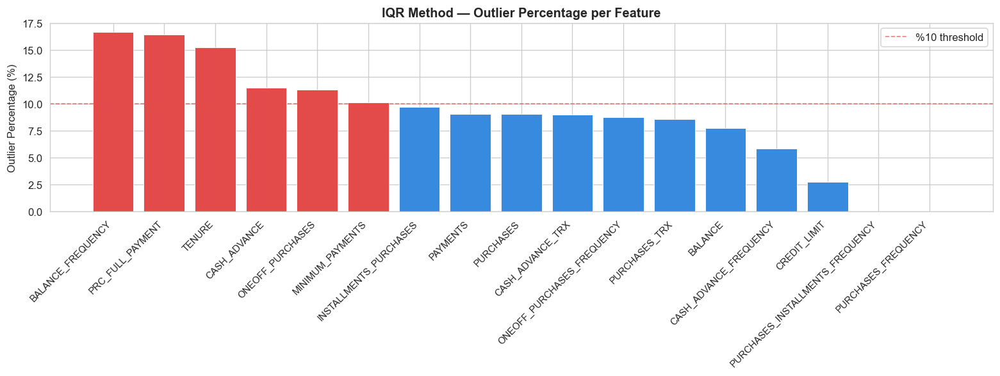

In [14]:
# Outlier Percentage Bar Chart
fig, ax = plt.subplots(figsize=(13, 5))
bar_colors = ['#E24B4A' if p > 10 else '#378ADD' for p in outlier_report['Outlier %']]
ax.bar(outlier_report['Feature'], outlier_report['Outlier %'],
       color=bar_colors, edgecolor='white', linewidth=0.5)
ax.axhline(10, color='#E24B4A', linestyle='--', linewidth=1,
           alpha=0.7, label='%10 threshold')
ax.set_title('IQR Method — Outlier Percentage per Feature', fontweight='bold')
ax.set_ylabel('Outlier Percentage (%)')
plt.xticks(rotation=45, ha='right', fontsize=9)
ax.legend()
plt.tight_layout()
plt.show()

In [15]:
df_clean = df.copy()

for feat in FEATURES:
    q1    = df[feat].quantile(0.25)
    q3    = df[feat].quantile(0.75)
    iqr   = q3 - q1
    lower = q1 - 1.5 * iqr
    upper = q3 + 1.5 * iqr
    df_clean[feat] = df_clean[feat].clip(lower=lower, upper=upper)

print(f'Cleaning before size: {df.shape}')
print(f'Cleaning after size: {df_clean.shape}  (no row loss)')

Cleaning before size: (8950, 18)
Cleaning after size: (8950, 18)  (no row loss)


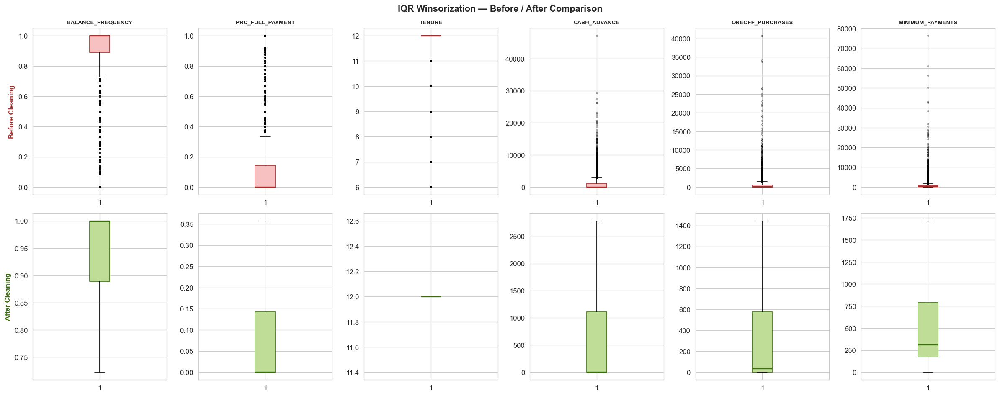

In [16]:
# Before/After comparison — 6 features with the most outliers
top6 = outlier_report.head(6)['Feature'].tolist()

fig, axes = plt.subplots(2, 6, figsize=(20, 8))

for col_idx, feat in enumerate(top6):
    # Before
    axes[0, col_idx].boxplot(
        df[feat], patch_artist=True,
        boxprops=dict(facecolor='#F7C1C1', color='#A32D2D'),
        medianprops=dict(color='#A32D2D', linewidth=2),
        flierprops=dict(marker='o', markersize=2, alpha=0.4, color='#E24B4A')
    )
    axes[0, col_idx].set_title(feat, fontsize=8, fontweight='bold')
    if col_idx == 0:
        axes[0, col_idx].set_ylabel('Before Cleaning', fontweight='bold', color='#A32D2D')

    # After
    axes[1, col_idx].boxplot(
        df_clean[feat], patch_artist=True,
        boxprops=dict(facecolor='#C0DD97', color='#3B6D11'),
        medianprops=dict(color='#3B6D11', linewidth=2),
        flierprops=dict(marker='o', markersize=2, alpha=0.4, color='#639922')
    )
    if col_idx == 0:
        axes[1, col_idx].set_ylabel('After Cleaning', fontweight='bold', color='#3B6D11')

fig.suptitle('IQR Winsorization — Before / After Comparison',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()

In [17]:
# Statistical comparision 
pd.DataFrame({
    'Ort. (Before)' : df[FEATURES].mean().round(2),
    'Ort. (After)': df_clean[FEATURES].mean().round(2),
    'Std (Before)'  : df[FEATURES].std().round(2),
    'Std (After)' : df_clean[FEATURES].std().round(2),
    'Max (Before)'  : df[FEATURES].max().round(2),
    'Max (After)' : df_clean[FEATURES].max().round(2),
})

,Ort. (Before),Ort. (After),Std (Before),Std (After),Max (Before),Max (After)
BALANCE,1564.47,1390.51,2081.53,1537.54,19043.14,4942.93
BALANCE_FREQUENCY,0.88,0.93,0.24,0.11,1.00,1.00
PURCHASES,1003.20,737.15,2136.63,879.53,49039.57,2715.87
ONEOFF_PURCHASES,592.44,354.36,1659.89,511.82,40761.25,1443.51
INSTALLMENTS_PURCHASES,411.07,295.55,904.34,396.18,22500.00,1171.59
CASH_ADVANCE,978.87,672.47,2097.16,998.51,47137.21,2784.55
PURCHASES_FREQUENCY,0.49,0.49,0.40,0.40,1.00,1.00
ONEOFF_PURCHASES_FREQUENCY,0.20,0.18,0.30,0.26,1.00,0.75
PURCHASES_INSTALLMENTS_FREQUENCY,0.36,0.36,0.40,0.40,1.00,1.00
CASH_ADVANCE_FREQUENCY,0.14,0.13,0.20,0.17,1.50,0.56


In [18]:
# Save the clean data for the next steps
df_clean.to_csv('cc_cleaned.csv', index=False)
print('Saved: cc_cleaned.csv')
print(f'Final size: {df_clean.shape}')
print(df_clean['CLASS'].value_counts().sort_index())

Saved: cc_cleaned.csv
Final size: (8950, 18)
CLASS
0    3977
1     409
2    1197
3    3367
Name: count, dtype: int64


In [19]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Import the clean data (saved from the first step)
df_clean = pd.read_csv('cc_cleaned.csv')
FEATURES = [c for c in df_clean.columns if c != 'CLASS']

print(f'Final size: {df_clean.shape}')

Final size: (8950, 18)


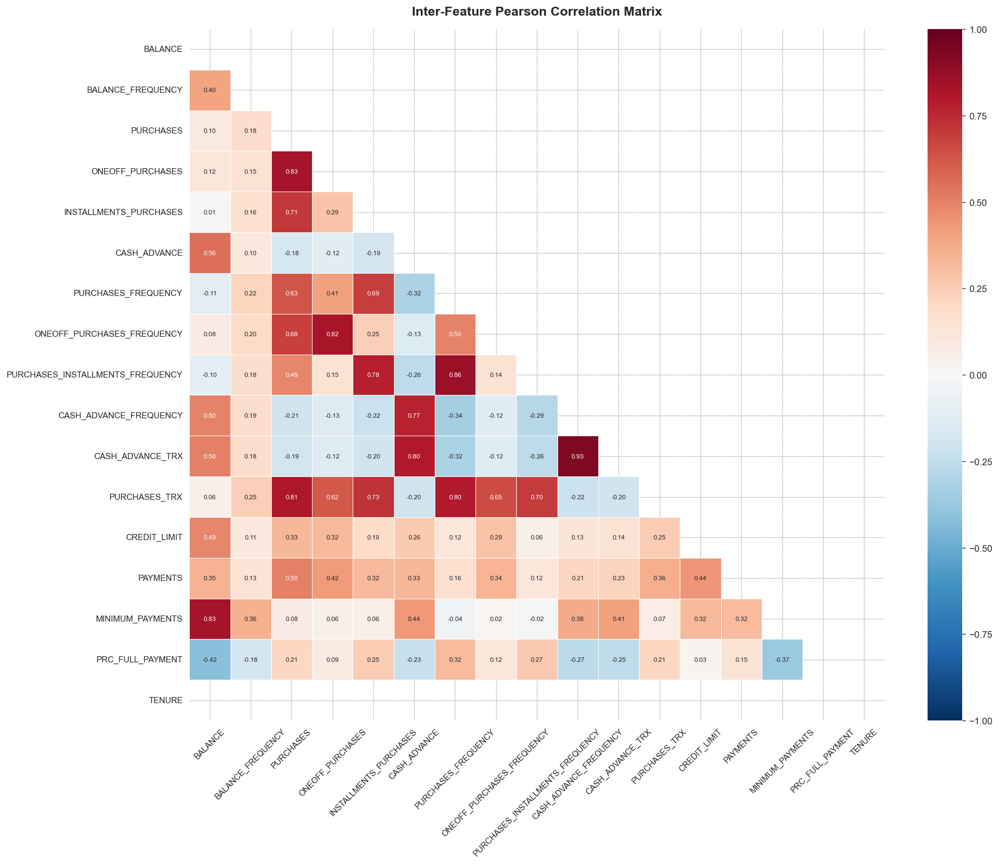

In [20]:
# Feature-to-feature correlation only (excluding CLASS)
corr_matrix = df_clean[FEATURES].corr(method='pearson')

# Mask — hide the upper triangle (removes redundant information)
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

fig, ax = plt.subplots(figsize=(16, 13))

sns.heatmap(
    corr_matrix,
    mask=mask,
    annot=True,
    fmt='.2f',
    cmap='RdBu_r',
    center=0,
    vmin=-1,
    vmax=1,
    linewidths=0.4,
    linecolor='white',
    annot_kws={'size': 7},
    ax=ax
)

ax.set_title('Inter-Feature Pearson Correlation Matrix',
             fontsize=14, fontweight='bold', pad=15)
ax.tick_params(axis='x', rotation=45, labelsize=9)
ax.tick_params(axis='y', rotation=0,  labelsize=9)
plt.tight_layout()
plt.show()

In [21]:
##### COMMENTS ON THE RESULTS #####

### The Pearson correlation matrix reveals the linear relationships between all
### feature pairs. Two behavioral clusters are evident: a shopping group
### (PURCHASES, ONEOFF_PURCHASES, PURCHASES_TRX and their frequency counterparts)
### and a cash advance group (CASH_ADVANCE, CASH_ADVANCE_FREQUENCY, CASH_ADVANCE_TRX),
### each internally highly correlated while negatively correlated with each other,
### indicating two distinct customer types.
### BALANCE shows strong positive correlation with both MINIMUM_PAYMENTS and
### CASH_ADVANCE, while PRC_FULL_PAYMENT correlates negatively with BALANCE,
### as expected. TENURE shows no meaningful correlation with any feature,
### confirming its low discriminative power observed in prior steps.
### These highly correlated feature pairs introduce multicollinearity risk;
### when multiple variables carrying the same information enter the model,
### they can distort the analysis. This justifies the application of PCA
### for dimensionality reduction in subsequent steps.

#####

In [22]:
# List strong correlations (|r| > 0.5) as a table
corr_pairs = (
    corr_matrix
    .where(np.tril(np.ones(corr_matrix.shape), k=-1).astype(bool))
    .stack()
    .reset_index()
)
corr_pairs.columns = ['Feature 1', 'Feature 2', 'Correlation']
corr_pairs['|Correlation|'] = corr_pairs['Correlation'].abs()

strong = (corr_pairs[corr_pairs['|Correlation|'] > 0.5]
          .sort_values('|Correlation|', ascending=False)
          .reset_index(drop=True))

print(f'Number of pairs with |r| > 0.5: {len(strong)}')
strong

Number of pairs with |r| > 0.5: 21


,Feature 1,Feature 2,Correlation,|Correlation|
0,CASH_ADVANCE_TRX,CASH_ADVANCE_FREQUENCY,0.930204,0.930204
1,PURCHASES_INSTALLMENTS_FREQUENCY,PURCHASES_FREQUENCY,0.862934,0.862934
2,MINIMUM_PAYMENTS,BALANCE,0.833313,0.833313
3,ONEOFF_PURCHASES,PURCHASES,0.830603,0.830603
4,ONEOFF_PURCHASES_FREQUENCY,ONEOFF_PURCHASES,0.821933,0.821933
5,PURCHASES_TRX,PURCHASES,0.808546,0.808546
6,CASH_ADVANCE_TRX,CASH_ADVANCE,0.801425,0.801425
7,PURCHASES_TRX,PURCHASES_FREQUENCY,0.795194,0.795194
8,PURCHASES_INSTALLMENTS_FREQUENCY,INSTALLMENTS_PURCHASES,0.780193,0.780193
9,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE,0.769767,0.769767


In [23]:
# Correlation of each feature with the CLASS label
feat_class_corr = (
    df_clean[FEATURES + ['CLASS']]
    .corr(method='pearson')['CLASS']
    .drop('CLASS')
    .sort_values(key=abs, ascending=False)
    .reset_index()
)
feat_class_corr.columns = ['Feature', 'Correlation (with CLASS)']
feat_class_corr['|Correlation|'] = feat_class_corr['Correlation (with CLASS)'].abs().round(4)
feat_class_corr['Correlation (with CLASS)'] = feat_class_corr['Correlation (with CLASS)'].round(4)

print('Feature — Class Correlation (Sorted by Absolute Value):')
feat_class_corr

Feature — Class Correlation (Sorted by Absolute Value):


,Feature,Correlation (with CLASS),|Correlation|
0,PURCHASES_FREQUENCY,0.7476,0.7476
1,PURCHASES_INSTALLMENTS_FREQUENCY,0.6659,0.6659
2,PURCHASES_TRX,0.5452,0.5452
3,INSTALLMENTS_PURCHASES,0.5022,0.5022
4,PURCHASES,0.4011,0.4011
5,ONEOFF_PURCHASES_FREQUENCY,0.2788,0.2788
6,PRC_FULL_PAYMENT,0.2728,0.2728
7,BALANCE_FREQUENCY,0.2631,0.2631
8,ONEOFF_PURCHASES,0.2017,0.2017
9,PAYMENTS,0.1627,0.1627


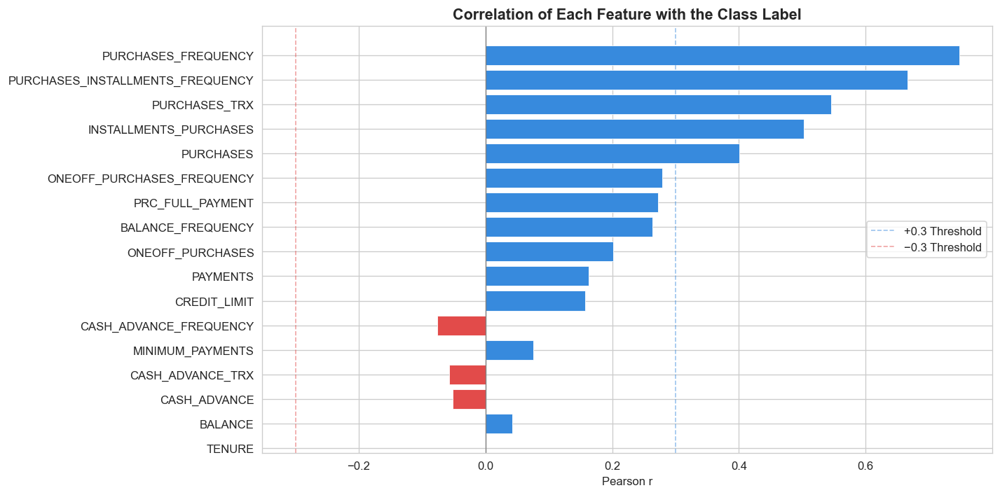

In [24]:
# Bar chart — feature-class correlation
fig, ax = plt.subplots(figsize=(12, 6))

bar_colors = ['#E24B4A' if v < 0 else '#378ADD'
              for v in feat_class_corr['Correlation (with CLASS)']]

bars = ax.barh(
    feat_class_corr['Feature'],
    feat_class_corr['Correlation (with CLASS)'],
    color=bar_colors,
    edgecolor='white',
    linewidth=0.5
)

ax.axvline(0, color='gray', linewidth=0.8)
ax.axvline( 0.3, color='#378ADD', linewidth=1, linestyle='--', alpha=0.5, label='+0.3 Threshold')
ax.axvline(-0.3, color='#E24B4A', linewidth=1, linestyle='--', alpha=0.5, label='−0.3 Threshold')

ax.set_title('Correlation of Each Feature with the Class Label',
             fontweight='bold', fontsize=13)
ax.set_xlabel('Pearson r')
ax.invert_yaxis()
ax.legend()
plt.tight_layout()
plt.show()

In [25]:
###### COMMENTS ON THE RESULTS #####

### The bar chart shows the Pearson correlation of each feature with the class label.
### Frequency and transaction-based purchasing features (PURCHASES_FREQUENCY,
### PURCHASES_INSTALLMENTS_FREQUENCY, PURCHASES_TRX) exhibit the strongest
### positive correlation with CLASS, making them the most discriminative variables.
### Cash advance features (CASH_ADVANCE, CASH_ADVANCE_TRX, CASH_ADVANCE_FREQUENCY)
### show negative correlations, reflecting that cash-advance-oriented customers
### concentrate in a distinct class. TENURE shows virtually no correlation,
### confirming its negligible contribution to class separation.
### Features that do not exceed the ±0.3 threshold have limited predictive
### power with respect to the class label.

#####

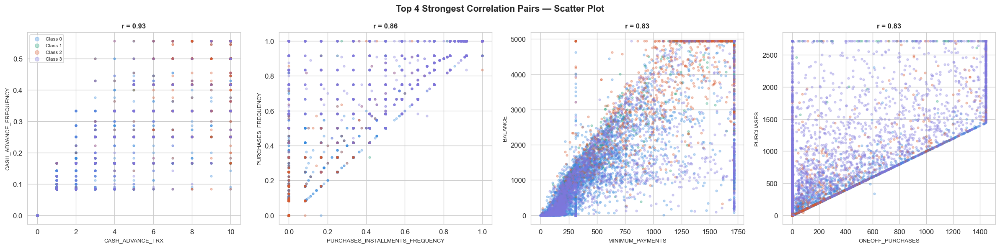

In [26]:
# Visualize the 4 strongest correlation pairs with scatter plots
top4_pairs = strong.head(4)
palette    = ['#378ADD', '#1D9E75', '#D85A30', '#7F77DD']

fig, axes = plt.subplots(1, 4, figsize=(20, 5))

for idx, row in top4_pairs.iterrows():
    feat1 = row['Feature 1']
    feat2 = row['Feature 2']
    r_val = row['Correlation']
    ax    = axes[idx]

    for cls in sorted(df_clean['CLASS'].unique()):
        subset = df_clean[df_clean['CLASS'] == cls]
        ax.scatter(subset[feat1], subset[feat2],
                   alpha=0.3, s=8, color=palette[cls], label=f'Class {cls}')

    ax.set_title(f'r = {r_val:.2f}', fontweight='bold', fontsize=10)
    ax.set_xlabel(feat1, fontsize=8)
    ax.set_ylabel(feat2, fontsize=8)
    if idx == 0:
        ax.legend(fontsize=7, markerscale=2)

fig.suptitle('Top 4 Strongest Correlation Pairs — Scatter Plot',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()

In [27]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler

df_clean = pd.read_csv('cc_cleaned.csv')
FEATURES = [c for c in df_clean.columns if c != 'CLASS']

In [28]:
# 3a -----------------------------------------------------------------------
# Z-Score Normalization (StandardScaler)
# Transforms each feature to have a mean of 0 and a standard deviation of 1.
# Formula: $z = \frac{x - \mu}{\sigma}$
# --------------------------------------------------------------------------

scaler = StandardScaler()
X_normalized = scaler.fit_transform(df_clean[FEATURES])

df_norm = pd.DataFrame(X_normalized, columns=FEATURES)
df_norm['CLASS'] = df_clean['CLASS'].values

# Check after normalization
norm_check = pd.DataFrame({
    'Mean'   : df_norm[FEATURES].mean().round(6),
    'Std'    : df_norm[FEATURES].std().round(6),
    'Min'    : df_norm[FEATURES].min().round(3),
    'Max'    : df_norm[FEATURES].max().round(3)
})

print('Post-normalization statistics (mean should be ≈ 0, std should be ≈ 1):')
norm_check

Post-normalization statistics (mean should be ≈ 0, std should be ≈ 1):


,Mean,Std,Min,Max
BALANCE,0.0,1.000056,-0.904,2.311
BALANCE_FREQUENCY,-0.0,1.000056,-1.887,0.616
PURCHASES,0.0,1.000056,-0.838,2.250
ONEOFF_PURCHASES,0.0,1.000056,-0.692,2.128
INSTALLMENTS_PURCHASES,-0.0,1.000056,-0.746,2.211
CASH_ADVANCE,0.0,1.000056,-0.674,2.115
PURCHASES_FREQUENCY,-0.0,1.000056,-1.222,1.270
ONEOFF_PURCHASES_FREQUENCY,-0.0,1.000056,-0.723,2.211
PURCHASES_INSTALLMENTS_FREQUENCY,0.0,1.000056,-0.917,1.599
CASH_ADVANCE_FREQUENCY,0.0,1.000056,-0.730,2.487


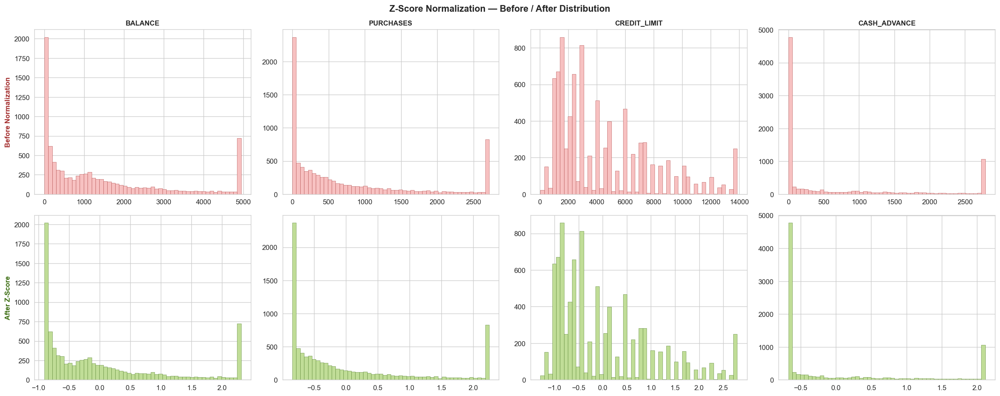

In [29]:
# 3a — Pre/Post Normalization Distribution Comparison
# Visual comparison using 4 selected features
sample_feats = ['BALANCE', 'PURCHASES', 'CREDIT_LIMIT', 'CASH_ADVANCE']

fig, axes = plt.subplots(2, 4, figsize=(20, 8))

for col_idx, feat in enumerate(sample_feats):
    # Before
    axes[0, col_idx].hist(df_clean[feat], bins=50,
                          color='#F7C1C1', edgecolor='#A32D2D', linewidth=0.3)
    axes[0, col_idx].set_title(feat, fontweight='bold', fontsize=10)
    if col_idx == 0:
        axes[0, col_idx].set_ylabel('Before Normalization', fontweight='bold',
                                    color='#A32D2D')
    # After
    axes[1, col_idx].hist(df_norm[feat], bins=50,
                          color='#C0DD97', edgecolor='#3B6D11', linewidth=0.3)
    if col_idx == 0:
        axes[1, col_idx].set_ylabel('After Z-Score', fontweight='bold',
                                    color='#3B6D11')

fig.suptitle('Z-Score Normalization — Before / After Distribution',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()

In [30]:
###### COMMENTS ON THE RESULTS ######

### The histograms confirm that Z-score normalization preserves the original
### distribution shape — skewness and multimodal structures remain unchanged.
### Only the scale is transformed: all features are shifted to mean=0 and std=1,
### eliminating the dominance of features with large numeric ranges
### (e.g. CREDIT_LIMIT) over those with smaller ranges.
### This ensures that distance-based and variance-based methods in subsequent
### steps treat all features equally, regardless of their original units.

######

In [31]:
# 3b -----------------------------------------------------------------------
# Fisher Distance (Multi-Class Fisher Criterion) Calculation
# Measures the separability between classes for each feature.
# High FD -> That feature separates classes well from each other
# --------------------------------------------------------------------------

def fisher_distance(df_normalized, features, class_col='CLASS'):
    classes    = sorted(df_normalized[class_col].unique())
    n_total    = len(df_normalized)
    fd_scores  = {}

    for feat in features:
        overall_mean  = df_normalized[feat].mean()
        between_var   = 0.0   # Between-class
        within_var    = 0.0   # Within-class

        for cls in classes:
            subset  = df_normalized[df_normalized[class_col] == cls][feat]
            n_c     = len(subset)
            mu_c    = subset.mean()
            sigma_c = subset.var()   # Within-class variance

            between_var += n_c * (mu_c - overall_mean) ** 2
            within_var  += n_c * sigma_c

        fd_scores[feat] = between_var / within_var if within_var != 0 else 0.0

    result = (pd.Series(fd_scores)
                .sort_values(ascending=False)
                .reset_index())
    result.columns = ['Feature', 'Fisher Distance']
    result['Fisher Distance'] = result['Fisher Distance'].round(6)
    return result

fd_table = fisher_distance(df_norm, FEATURES)

print('Fisher Distance Scores (Descending Order):')
fd_table

Fisher Distance Scores (Descending Order):


,Feature,Fisher Distance
0,PURCHASES_FREQUENCY,2.844009
1,PURCHASES_INSTALLMENTS_FREQUENCY,1.457190
2,PURCHASES_TRX,1.395838
3,CASH_ADVANCE,1.046212
4,CASH_ADVANCE_TRX,1.005765
5,CASH_ADVANCE_FREQUENCY,0.951669
6,PURCHASES,0.819746
7,INSTALLMENTS_PURCHASES,0.805994
8,BALANCE,0.642825
9,PAYMENTS,0.401740


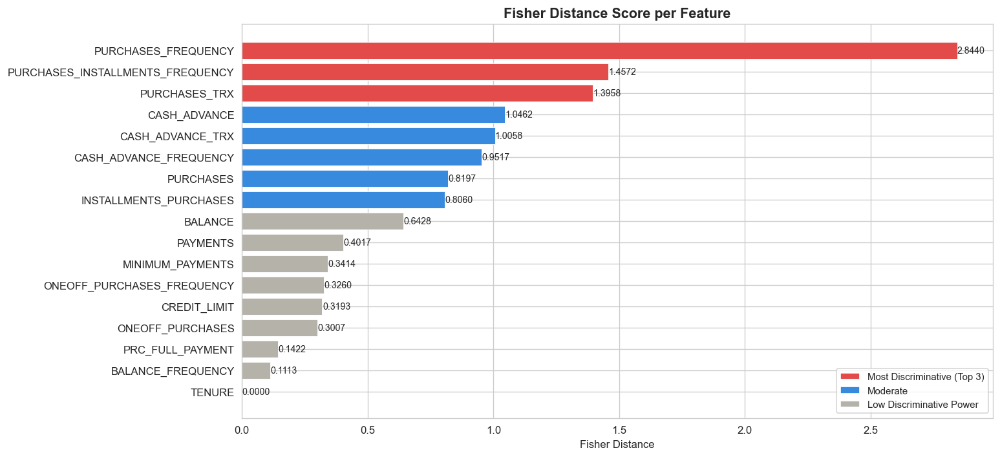

In [32]:
# 3b — Fisher Distance bar chart
fig, ax = plt.subplots(figsize=(13, 6))

bar_colors = ['#E24B4A' if i < 3 else '#378ADD' if i < 8 else '#B4B2A9'
              for i in range(len(fd_table))]

bars = ax.barh(
    fd_table['Feature'],
    fd_table['Fisher Distance'],
    color=bar_colors,
    edgecolor='white',
    linewidth=0.5
)

# Annotate values at the end of each bar
for bar, val in zip(bars, fd_table['Fisher Distance']):
    ax.text(bar.get_width() + 0.001, bar.get_y() + bar.get_height() / 2,
            f'{val:.4f}', va='center', fontsize=8.5)

# Legend explanations
from matplotlib.patches import Patch
legend_elements = [
    Patch(facecolor='#E24B4A', label='Most Discriminative (Top 3)'),
    Patch(facecolor='#378ADD', label='Moderate'),
    Patch(facecolor='#B4B2A9', label='Low Discriminative Power'),
]
ax.legend(handles=legend_elements, fontsize=9)
ax.set_title('Fisher Distance Score per Feature',
             fontweight='bold', fontsize=13)
ax.set_xlabel('Fisher Distance')
ax.invert_yaxis()
plt.tight_layout()
plt.show()

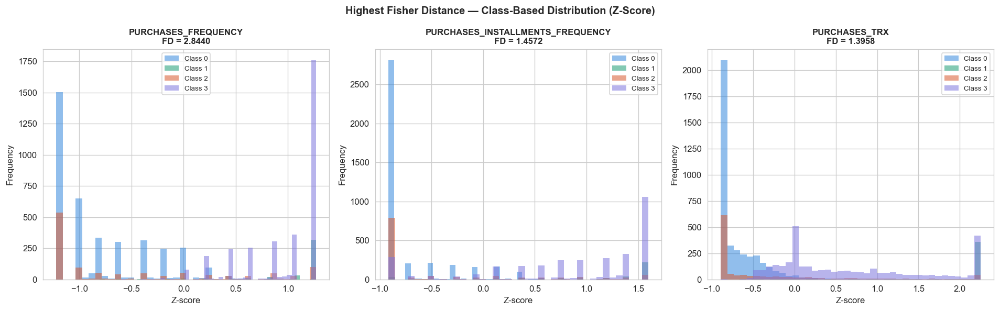

In [33]:
# 3b — Class-based distributions (Supports Fisher)
# High FD features should show significant mean differences between classes

top3_feats = fd_table.head(3)['Feature'].tolist()
palette    = ['#378ADD', '#1D9E75', '#D85A30', '#7F77DD']

fig, axes = plt.subplots(1, 3, figsize=(16, 5))

for idx, feat in enumerate(top3_feats):
    ax = axes[idx]
    for cls in sorted(df_norm['CLASS'].unique()):
        subset = df_norm[df_norm['CLASS'] == cls][feat]
        ax.hist(subset, bins=40, alpha=0.55, color=palette[cls],
                label=f'Class {cls}', edgecolor='none')

    fd_val = fd_table[fd_table['Feature'] == feat]['Fisher Distance'].values[0]
    ax.set_title(f'{feat}\nFD = {fd_val:.4f}', fontweight='bold', fontsize=10)
    ax.set_xlabel('Z-score')
    ax.set_ylabel('Frequency')
    ax.legend(fontsize=8)

fig.suptitle('Highest Fisher Distance — Class-Based Distribution (Z-Score)',
             fontsize=12, fontweight='bold')
plt.tight_layout()
plt.show()

In [34]:
###### COMMENTS ON THE RESULTS ######

### The histograms display the class-based distributions of the three features
### with the highest Fisher Distance scores. In PURCHASES_FREQUENCY, Class 0
### and Class 2 concentrate at low z-scores while Class 3 peaks sharply at
### the high end, confirming strong class separation. Similar patterns are
### observed in PURCHASES_INSTALLMENTS_FREQUENCY and PURCHASES_TRX.
### The high Fisher Distance values are visually supported by well-separated
### class means and relatively narrow within-class distributions — precisely
### the conditions that yield a high Fisher ratio.

######

In [35]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

df_clean = pd.read_csv('cc_cleaned.csv')
FEATURES = [c for c in df_clean.columns if c != 'CLASS']

# Z-score (the same process applied in step 3)
scaler   = StandardScaler()
X_scaled = scaler.fit_transform(df_clean[FEATURES])
df_norm  = pd.DataFrame(X_scaled, columns=FEATURES)
df_norm['CLASS'] = df_clean['CLASS'].values

# Fisher Distance function from step 3 (redefining here)
def fisher_distance(dataframe, features, class_col='CLASS'):
    classes   = sorted(dataframe[class_col].unique())
    fd_scores = {}
    for feat in features:
        overall_mean = dataframe[feat].mean()
        between_var  = 0.0
        within_var   = 0.0
        for cls in classes:
            subset = dataframe[dataframe[class_col] == cls][feat]
            n_c    = len(subset)
            between_var += n_c * (subset.mean() - overall_mean) ** 2
            within_var  += n_c * subset.var()
        fd_scores[feat] = between_var / within_var if within_var != 0 else 0.0
    return pd.Series(fd_scores).sort_values(ascending=False)

In [36]:
# 4a -----------------------------------------------------------------------
# PCA Transformation
# Projecting the normalized data onto all 17 eigenvectors.
# The projection on each eigenvector is treated as a new feature (PC).
# --------------------------------------------------------------------------

pca = PCA(n_components=len(FEATURES), random_state=42)
X_pca = pca.fit_transform(X_scaled)

# PC column names
pc_cols = [f'PC{i+1}' for i in range(len(FEATURES))]

df_pca          = pd.DataFrame(X_pca, columns=pc_cols)
df_pca['CLASS'] = df_clean['CLASS'].values

print(f'PCA transformation completed. Shape: {df_pca.shape}')
print(f'\nEigenvalues:')
for i, (eigval, ratio) in enumerate(
        zip(pca.explained_variance_, pca.explained_variance_ratio_), 1):
    cumsum = pca.explained_variance_ratio_[:i].sum()
    print(f'  PC{i:2d}  eigenvalue={eigval:7.4f}  '
          f'explained variance={ratio*100:5.2f}%  cumulative={cumsum*100:6.2f}%')

PCA transformation completed. Shape: (8950, 18)

Eigenvalues:
  PC 1  eigenvalue= 5.3372  explained variance=33.35%  cumulative= 33.35%
  PC 2  eigenvalue= 4.0600  explained variance=25.37%  cumulative= 58.73%
  PC 3  eigenvalue= 1.5448  explained variance= 9.65%  cumulative= 68.38%
  PC 4  eigenvalue= 1.2942  explained variance= 8.09%  cumulative= 76.47%
  PC 5  eigenvalue= 0.9701  explained variance= 6.06%  cumulative= 82.53%
  PC 6  eigenvalue= 0.6713  explained variance= 4.20%  cumulative= 86.73%
  PC 7  eigenvalue= 0.5578  explained variance= 3.49%  cumulative= 90.21%
  PC 8  eigenvalue= 0.4355  explained variance= 2.72%  cumulative= 92.93%
  PC 9  eigenvalue= 0.3234  explained variance= 2.02%  cumulative= 94.95%
  PC10  eigenvalue= 0.2212  explained variance= 1.38%  cumulative= 96.34%
  PC11  eigenvalue= 0.1858  explained variance= 1.16%  cumulative= 97.50%
  PC12  eigenvalue= 0.1335  explained variance= 0.83%  cumulative= 98.33%
  PC13  eigenvalue= 0.1204  explained variance= 0.

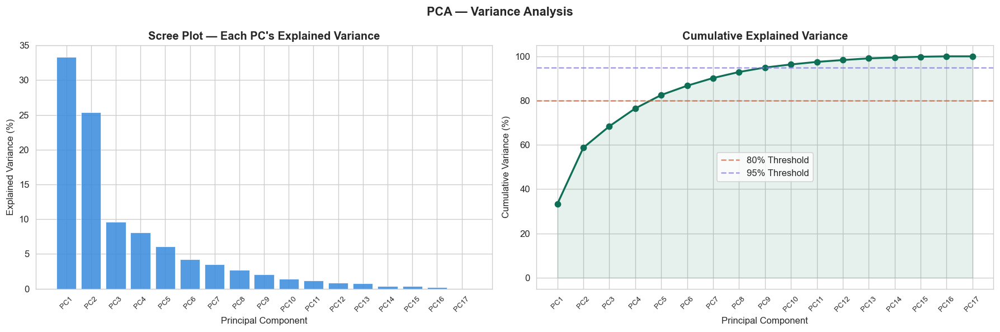

Number of PCs required for 80% variance: 5
Number of PCs required for 95% variance: 10


In [37]:
# 4a — Explained Variance Plot (Scree Plot)
cumvar = np.cumsum(pca.explained_variance_ratio_) * 100

fig, axes = plt.subplots(1, 2, figsize=(15, 5))

# Scree plot
axes[0].bar(pc_cols, pca.explained_variance_ratio_ * 100,
            color='#378ADD', edgecolor='white', linewidth=0.5, alpha=0.85)
axes[0].set_title("Scree Plot — Each PC's Explained Variance",
                  fontweight='bold')
axes[0].set_xlabel('Principal Component')
axes[0].set_ylabel('Explained Variance (%)')
axes[0].tick_params(axis='x', rotation=45, labelsize=8)

# Cumulative variance
axes[1].plot(pc_cols, cumvar, 'o-', color='#0F6E56', linewidth=2, markersize=6)
axes[1].axhline(80, color='#D85A30', linestyle='--', alpha=0.7, label='80% Threshold')
axes[1].axhline(95, color='#7F77DD', linestyle='--', alpha=0.7, label='95% Threshold')
axes[1].fill_between(range(len(pc_cols)), cumvar, alpha=0.1, color='#0F6E56')
axes[1].set_title('Cumulative Explained Variance', fontweight='bold')
axes[1].set_xlabel('Principal Component')
axes[1].set_ylabel('Cumulative Variance (%)')
axes[1].set_xticks(range(len(pc_cols)))
axes[1].set_xticklabels(pc_cols, rotation=45, fontsize=8)
axes[1].legend()

plt.suptitle('PCA — Variance Analysis', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()

# How many PCs are needed to explain 80% and 95% of the variance?
n80 = np.argmax(cumvar >= 80) + 1
n95 = np.argmax(cumvar >= 95) + 1
print(f'Number of PCs required for 80% variance: {n80}')
print(f'Number of PCs required for 95% variance: {n95}')

In [38]:
###### COMMENTS ON THE RESULTS ######

### The scree plot shows that PC1 and PC2 together explain approximately 58%
### of the total variance, with a steep drop-off after PC3 indicating that
### most information is concentrated in the first few components.
### The cumulative variance plot confirms that roughly 6 components suffice
### to capture 80% of the variance, and around 9-10 components reach the 95%
### threshold. This demonstrates that the 17 original features contain
### significant redundancy, and dimensionality can be substantially reduced
### without major information loss — consistent with the high multicollinearity
### observed in the correlation analysis.

######

In [39]:
# 4b -----------------------------------------------------------------------
# Fisher Distance calculation for each PC
# Measuring how well the PCA components separate the classes.
# --------------------------------------------------------------------------

fd_pca_series = fisher_distance(df_pca, pc_cols)

fd_pca_table = fd_pca_series.reset_index()
fd_pca_table.columns = ['Component', 'Fisher Distance (PCA)']
fd_pca_table['Fisher Distance (PCA)'] = fd_pca_table['Fisher Distance (PCA)'].round(6)
fd_pca_table['Eigenvalue'] = [
    pca.explained_variance_[int(pc[2:])-1]
    for pc in fd_pca_table['Component']
]

print('Fisher Distance & Eigenvalue per PC:')
fd_pca_table

Fisher Distance & Eigenvalue per PC:


,Component,Fisher Distance (PCA),Eigenvalue
0,PC1,2.099400,5.337158
1,PC2,1.168687,4.060043
2,PC3,0.167968,1.544812
3,PC4,0.061560,1.294184
4,PC7,0.054423,0.557775
5,PC9,0.029827,0.323364
6,PC12,0.029540,0.133497
7,PC15,0.028269,0.053761
8,PC5,0.022831,0.970072
9,PC8,0.022779,0.435519


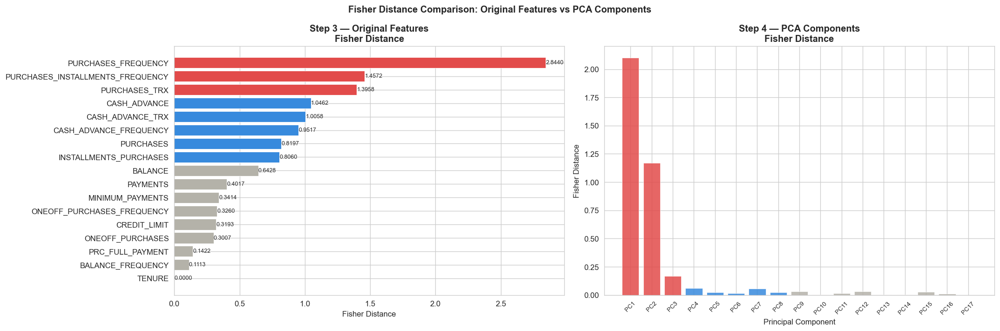

In [40]:
# 4c -----------------------------------------------------------------------
# Step 3 FD (Original Features) vs Step 4 FD (PCs) Comparison
# --------------------------------------------------------------------------

# Recalculate Step 3 FD (sorted, we will align it according to the number of PCs)
fd_orig_series = fisher_distance(df_norm, FEATURES)

fig, axes = plt.subplots(1, 2, figsize=(18, 6))

# Left — Original Features FD
colors_orig = ['#E24B4A' if i < 3 else '#378ADD' if i < 8 else '#B4B2A9'
               for i in range(len(fd_orig_series))]
axes[0].barh(fd_orig_series.index, fd_orig_series.values,
             color=colors_orig, edgecolor='white', linewidth=0.5)
axes[0].set_title('Step 3 — Original Features\nFisher Distance',
                  fontweight='bold')
axes[0].set_xlabel('Fisher Distance')
axes[0].invert_yaxis()

for i, val in enumerate(fd_orig_series.values):
    axes[0].text(val + 0.001, i, f'{val:.4f}', va='center', fontsize=7.5)

# Right — PCA Components FD (Ordered by PC index, not by FD value)
fd_pca_ordered = fd_pca_series.reindex(pc_cols)  # Ordered PC1 -> PC17
colors_pca = ['#E24B4A' if i < 3 else '#378ADD' if i < 8 else '#B4B2A9'
              for i in range(len(pc_cols))]
axes[1].bar(pc_cols, fd_pca_ordered.values,
            color=colors_pca, edgecolor='white', linewidth=0.5, alpha=0.85)
axes[1].set_title('Step 4 — PCA Components\nFisher Distance',
                  fontweight='bold')
axes[1].set_ylabel('Fisher Distance')
axes[1].set_xlabel('Principal Component')
axes[1].tick_params(axis='x', rotation=45, labelsize=8)

plt.suptitle('Fisher Distance Comparison: Original Features vs PCA Components',
             fontsize=12, fontweight='bold')
plt.tight_layout()
plt.show()

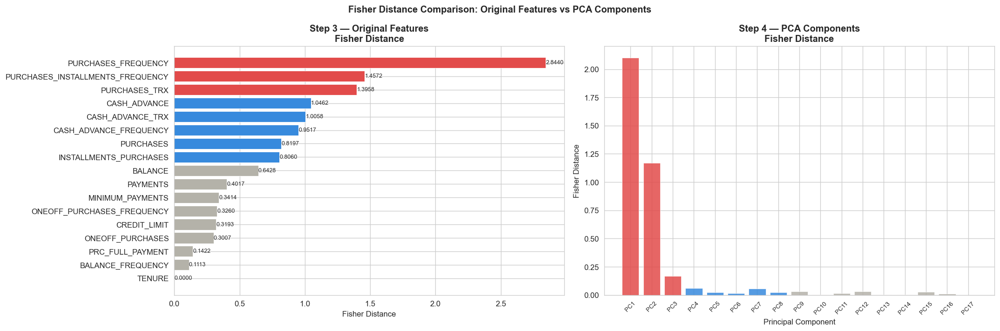

In [41]:
# 4c -----------------------------------------------------------------------
# Step 3 FD (Original Features) vs Step 4 FD (Components) Comparison
# --------------------------------------------------------------------------

# Recalculate Step 3 FD (sorted, we will align it according to the number of PCs)
fd_orig_series = fisher_distance(df_norm, FEATURES)

fig, axes = plt.subplots(1, 2, figsize=(18, 6))

# Left — Original Features FD
colors_orig = ['#E24B4A' if i < 3 else '#378ADD' if i < 8 else '#B4B2A9'
               for i in range(len(fd_orig_series))]
axes[0].barh(fd_orig_series.index, fd_orig_series.values,
             color=colors_orig, edgecolor='white', linewidth=0.5)
axes[0].set_title('Step 3 — Original Features\nFisher Distance',
                  fontweight='bold')
axes[0].set_xlabel('Fisher Distance')
axes[0].invert_yaxis()

for i, val in enumerate(fd_orig_series.values):
    axes[0].text(val + 0.001, i, f'{val:.4f}', va='center', fontsize=7.5)

# Right — PCA Components FD (Ordered by PC index, not by FD value)
fd_pca_ordered = fd_pca_series.reindex(pc_cols)  # Ordered PC1 -> PC17
colors_pca = ['#E24B4A' if i < 3 else '#378ADD' if i < 8 else '#B4B2A9'
              for i in range(len(pc_cols))]
axes[1].bar(pc_cols, fd_pca_ordered.values,
            color=colors_pca, edgecolor='white', linewidth=0.5, alpha=0.85)
axes[1].set_title('Step 4 — PCA Components\nFisher Distance',
                  fontweight='bold')
axes[1].set_ylabel('Fisher Distance')
axes[1].set_xlabel('Principal Component')
axes[1].tick_params(axis='x', rotation=45, labelsize=8)

plt.suptitle('Fisher Distance Comparison: Original Features vs PCA Components',
             fontsize=12, fontweight='bold')
plt.tight_layout()
plt.show()

Eigenvalue ↔ Fisher Distance Pearson correlation: r = 0.9585


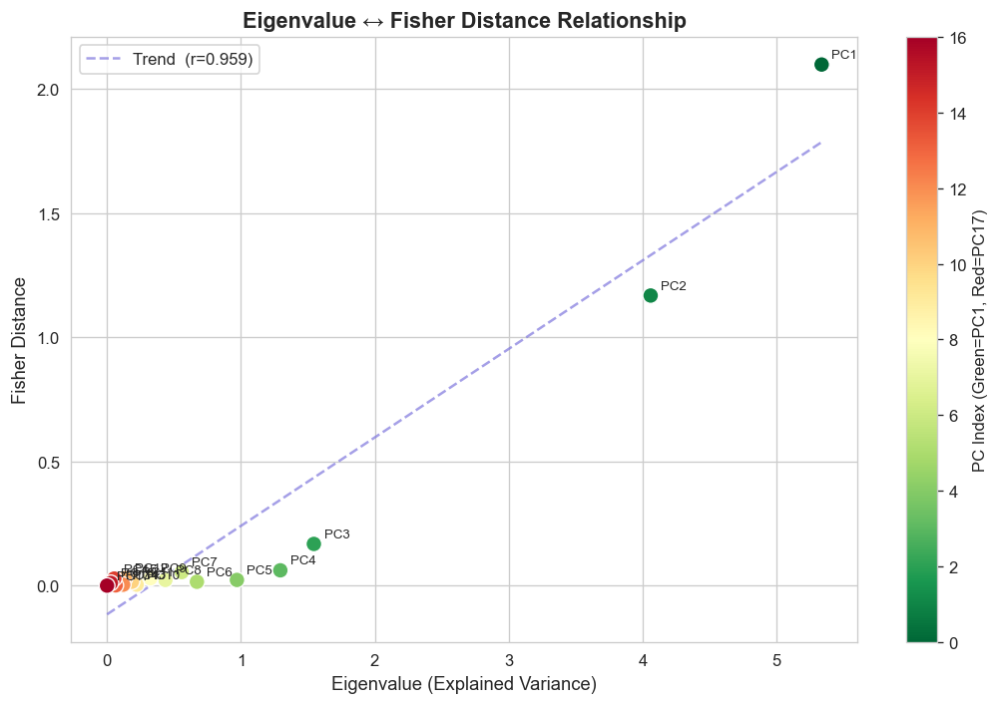

In [42]:
# 4d -----------------------------------------------------------------------
# Eigenvalue ↔ Fisher Distance Relationship
# In PCA, a large eigenvalue implies large variance, but this does not
# guarantee class separation. Let's analyze the correlation between these two with a scatter plot.
# --------------------------------------------------------------------------

# Align eigenvalues and FD values according to the PC index
eigenvalues = pca.explained_variance_                          # PC1 -> PC17
fd_by_pc    = fd_pca_series.reindex(pc_cols).values            # PC1 -> PC17

pearson_r = np.corrcoef(eigenvalues, fd_by_pc)[0, 1]
print(f'Eigenvalue ↔ Fisher Distance Pearson correlation: r = {pearson_r:.4f}')

fig, ax = plt.subplots(figsize=(9, 6))

scatter = ax.scatter(eigenvalues, fd_by_pc,
                     c=range(len(pc_cols)),
                     cmap='RdYlGn_r',
                     s=90, edgecolors='white', linewidth=0.8, zorder=3)

# Annotate each point with its PC label
for i, (x, y) in enumerate(zip(eigenvalues, fd_by_pc)):
    ax.annotate(f'PC{i+1}', (x, y),
                textcoords='offset points', xytext=(6, 4), fontsize=8)

# Trend line
z   = np.polyfit(eigenvalues, fd_by_pc, 1)
p   = np.poly1d(z)
x_line = np.linspace(eigenvalues.min(), eigenvalues.max(), 100)
ax.plot(x_line, p(x_line), '--', color='#7F77DD',
        linewidth=1.5, alpha=0.7, label=f'Trend  (r={pearson_r:.3f})')

plt.colorbar(scatter, ax=ax, label='PC Index (Green=PC1, Red=PC17)')
ax.set_xlabel('Eigenvalue (Explained Variance)', fontsize=11)
ax.set_ylabel('Fisher Distance', fontsize=11)
ax.set_title('Eigenvalue ↔ Fisher Distance Relationship',
             fontweight='bold', fontsize=13)
ax.legend()
plt.tight_layout()
plt.show()

In [43]:
# 4d — Summary table: eigenvalue + FD + explained variance % together
summary = pd.DataFrame({
    'Component'             : pc_cols,
    'Eigenvalue'            : eigenvalues.round(4),
    'Explained Variance %'  : (pca.explained_variance_ratio_ * 100).round(2),
    'Fisher Distance'       : [fd_by_pc[i] for i in range(len(pc_cols))]
}).round(6)

print('Summary Table — Eigenvalue & Fisher Distance:')
summary

Summary Table — Eigenvalue & Fisher Distance:


,Component,Eigenvalue,Explained Variance %,Fisher Distance
0,PC1,5.3372,33.35,2.099400
1,PC2,4.0600,25.37,1.168687
2,PC3,1.5448,9.65,0.167968
3,PC4,1.2942,8.09,0.061560
4,PC5,0.9701,6.06,0.022831
5,PC6,0.6713,4.20,0.015411
6,PC7,0.5578,3.49,0.054423
7,PC8,0.4355,2.72,0.022779
8,PC9,0.3234,2.02,0.029827
9,PC10,0.2212,1.38,0.003807


In [44]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

df_clean = pd.read_csv('cc_cleaned.csv')
FEATURES = [c for c in df_clean.columns if c != 'CLASS']

scaler  = StandardScaler()
X_scaled = scaler.fit_transform(df_clean[FEATURES])

pca   = PCA(n_components=len(FEATURES), random_state=42)
X_pca = pca.fit_transform(X_scaled)

pc_cols = [f'PC{i+1}' for i in range(len(FEATURES))]
df_pca  = pd.DataFrame(X_pca, columns=pc_cols)
df_pca['CLASS'] = df_clean['CLASS'].values

CLASS_COLORS  = ['#378ADD', '#1D9E75', '#D85A30', '#7F77DD']
CLASS_LABELS  = ['Sınıf 0', 'Sınıf 1', 'Sınıf 2', 'Sınıf 3']
classes       = sorted(df_pca['CLASS'].unique())

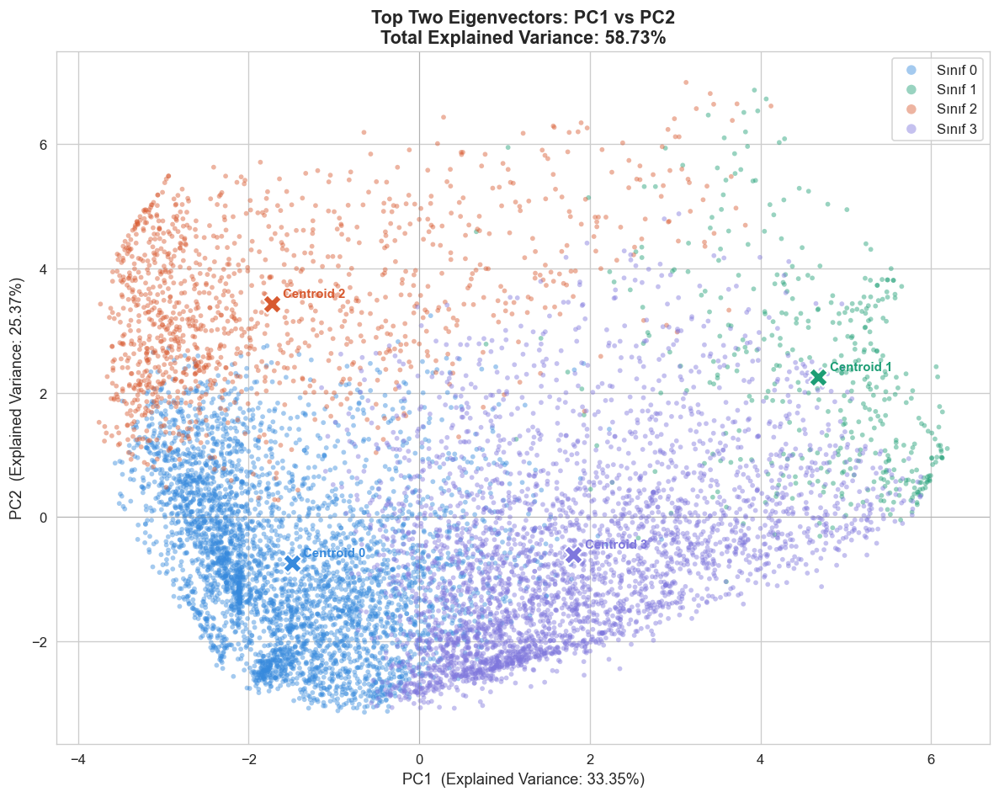

In [45]:
# 5a -----------------------------------------------------------------------
# Top Two Eigenvectors: PC1 and PC2
# Components with the highest eigenvalues — carrying the majority of the variance.
# --------------------------------------------------------------------------

var1 = pca.explained_variance_ratio_[0] * 100
var2 = pca.explained_variance_ratio_[1] * 100

fig, ax = plt.subplots(figsize=(10, 8))

for cls in classes:
    mask = df_pca['CLASS'] == cls
    ax.scatter(
        df_pca.loc[mask, 'PC1'],
        df_pca.loc[mask, 'PC2'],
        c=CLASS_COLORS[cls],
        label=CLASS_LABELS[cls],
        alpha=0.45,
        s=12,
        edgecolors='none'
    )

# Mark the class centroids
for cls in classes:
    mask   = df_pca['CLASS'] == cls
    cx, cy = df_pca.loc[mask, 'PC1'].mean(), df_pca.loc[mask, 'PC2'].mean()
    ax.scatter(cx, cy, c=CLASS_COLORS[cls], s=180,
               marker='X', edgecolors='white', linewidth=1.2, zorder=5)
    ax.annotate(f'Centroid {cls}', (cx, cy),
                textcoords='offset points', xytext=(8, 5),
                fontsize=9, fontweight='bold', color=CLASS_COLORS[cls])

ax.set_xlabel(f'PC1  (Explained Variance: {var1:.2f}%)', fontsize=11)
ax.set_ylabel(f'PC2  (Explained Variance: {var2:.2f}%)', fontsize=11)
ax.set_title(
    f'Top Two Eigenvectors: PC1 vs PC2\n'
    f'Total Explained Variance: {var1+var2:.2f}%',
    fontweight='bold', fontsize=13
)
ax.legend(fontsize=10, markerscale=2)
ax.axhline(0, color='gray', linewidth=0.5, alpha=0.4)
ax.axvline(0, color='gray', linewidth=0.5, alpha=0.4)
plt.tight_layout()
plt.savefig('pca_pc1_pc2.png', bbox_inches='tight')
plt.show()

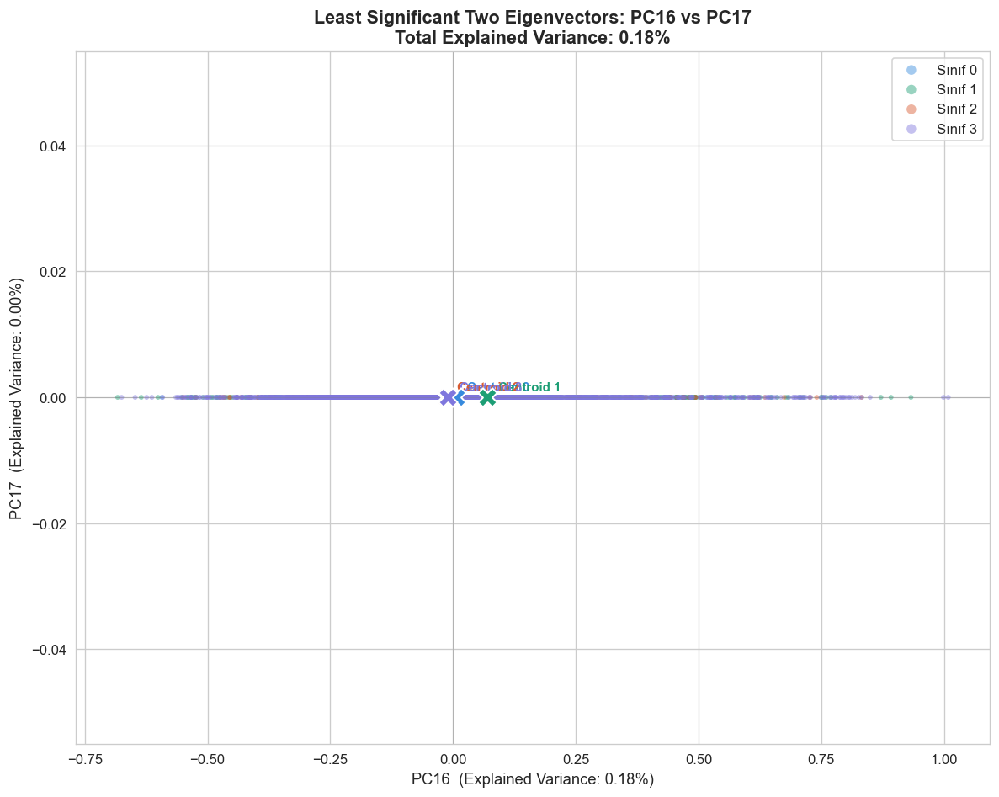

In [46]:
# 5b -----------------------------------------------------------------------
# Least Significant Two Eigenvectors: PC16 and PC17
# Components with the lowest eigenvalues — carrying almost pure noise.
# --------------------------------------------------------------------------

last_pc1_name = f'PC{len(FEATURES) - 1}'   # PC16
last_pc2_name = f'PC{len(FEATURES)}'        # PC17

var_last1 = pca.explained_variance_ratio_[-2] * 100
var_last2 = pca.explained_variance_ratio_[-1] * 100

fig, ax = plt.subplots(figsize=(10, 8))

for cls in classes:
    mask = df_pca['CLASS'] == cls
    ax.scatter(
        df_pca.loc[mask, last_pc1_name],
        df_pca.loc[mask, last_pc2_name],
        c=CLASS_COLORS[cls],
        label=CLASS_LABELS[cls],
        alpha=0.45,
        s=12,
        edgecolors='none'
    )

# Class centroids
for cls in classes:
    mask   = df_pca['CLASS'] == cls
    cx = df_pca.loc[mask, last_pc1_name].mean()
    cy = df_pca.loc[mask, last_pc2_name].mean()
    ax.scatter(cx, cy, c=CLASS_COLORS[cls], s=180,
               marker='X', edgecolors='white', linewidth=1.2, zorder=5)
    ax.annotate(f'Centroid {cls}', (cx, cy),
                textcoords='offset points', xytext=(8, 5),
                fontsize=9, fontweight='bold', color=CLASS_COLORS[cls])

ax.set_xlabel(f'{last_pc1_name}  (Explained Variance: {var_last1:.2f}%)', fontsize=11)
ax.set_ylabel(f'{last_pc2_name}  (Explained Variance: {var_last2:.2f}%)', fontsize=11)
ax.set_title(
    f'Least Significant Two Eigenvectors: {last_pc1_name} vs {last_pc2_name}\n'
    f'Total Explained Variance: {var_last1+var_last2:.2f}%',
    fontweight='bold', fontsize=13
)
ax.legend(fontsize=10, markerscale=2)
ax.axhline(0, color='gray', linewidth=0.5, alpha=0.4)
ax.axvline(0, color='gray', linewidth=0.5, alpha=0.4)
plt.tight_layout()
plt.savefig('pca_pc16_pc17.png', bbox_inches='tight')
plt.show()

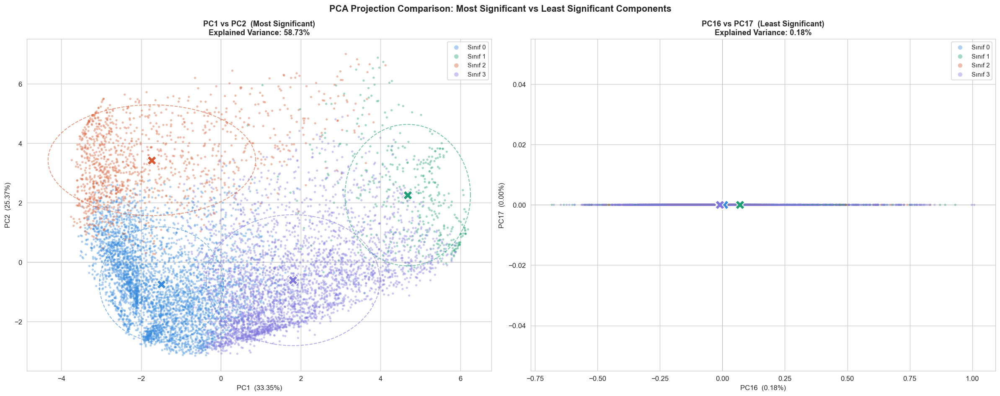

In [47]:
# 5c -----------------------------------------------------------------------
# Side-by-Side Plot Comparison
# --------------------------------------------------------------------------

fig, axes = plt.subplots(1, 2, figsize=(20, 8))

titles = [
    (f'PC1 vs PC2  (Most Significant)\nExplained Variance: {var1+var2:.2f}%',
     'PC1', 'PC2', var1, var2),
    (f'{last_pc1_name} vs {last_pc2_name}  (Least Significant)\nExplained Variance: {var_last1+var_last2:.2f}%',
     last_pc1_name, last_pc2_name, var_last1, var_last2)
]

for ax_idx, (title, xcol, ycol, xvar, yvar) in enumerate(titles):
    ax = axes[ax_idx]
    for cls in classes:
        mask = df_pca['CLASS'] == cls
        ax.scatter(df_pca.loc[mask, xcol], df_pca.loc[mask, ycol],
                   c=CLASS_COLORS[cls], label=CLASS_LABELS[cls],
                   alpha=0.4, s=10, edgecolors='none')

    # Class centers + confidence ellipses
    for cls in classes:
        mask = df_pca['CLASS'] == cls
        x_cls = df_pca.loc[mask, xcol].values
        y_cls = df_pca.loc[mask, ycol].values
        cx, cy = x_cls.mean(), y_cls.mean()
        sx, sy = x_cls.std(), y_cls.std()

        ax.scatter(cx, cy, c=CLASS_COLORS[cls], s=180,
                   marker='X', edgecolors='white', linewidth=1.2, zorder=5)

        # 1 standard deviation ellipse
        theta   = np.linspace(0, 2 * np.pi, 100)
        ellipse_x = cx + 1.5 * sx * np.cos(theta)
        ellipse_y = cy + 1.5 * sy * np.sin(theta)
        ax.plot(ellipse_x, ellipse_y, color=CLASS_COLORS[cls],
                linewidth=1.2, alpha=0.6, linestyle='--')

    ax.set_xlabel(f'{xcol}  ({xvar:.2f}%)', fontsize=10)
    ax.set_ylabel(f'{ycol}  ({yvar:.2f}%)', fontsize=10)
    ax.set_title(title, fontweight='bold', fontsize=11)
    ax.axhline(0, color='gray', linewidth=0.4, alpha=0.4)
    ax.axvline(0, color='gray', linewidth=0.4, alpha=0.4)
    ax.legend(fontsize=9, markerscale=2)

plt.suptitle('PCA Projection Comparison: Most Significant vs Least Significant Components',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('pca_comparison.png', bbox_inches='tight')
plt.show()

In [48]:
# 5d -----------------------------------------------------------------------
# Numerical Comparison: Distance Between Class Centroids
# Does PC1-PC2 or PC16-PC17 separate the classes better?
# --------------------------------------------------------------------------

from itertools import combinations

def class_center_distances(df_proj, xcol, ycol, classes):
    distances = {}
    centers   = {}
    for cls in classes:
        mask = df_proj['CLASS'] == cls
        centers[cls] = np.array([df_proj.loc[mask, xcol].mean(),
                                  df_proj.loc[mask, ycol].mean()])
    for c1, c2 in combinations(classes, 2):
        dist = np.linalg.norm(centers[c1] - centers[c2])
        distances[f'Class {c1} ↔ Class {c2}'] = round(dist, 4)
    return distances

dist_top = class_center_distances(df_pca, 'PC1',          'PC2',          classes)
dist_bot = class_center_distances(df_pca, last_pc1_name,  last_pc2_name,  classes)

dist_df = pd.DataFrame({
    'Class Pair'                                         : list(dist_top.keys()),
    'PC1-PC2 Centroid Distance'                          : list(dist_top.values()),
    f'{last_pc1_name}-{last_pc2_name} Centroid Distance': list(dist_bot.values())
})

print('Euclidean Distance Between Class Centroids:')
print(dist_df.to_string(index=False))
print(f'\nMean distance (PC1-PC2)         : {np.mean(list(dist_top.values())):.4f}')
print(f'Mean distance ({last_pc1_name}-{last_pc2_name}): {np.mean(list(dist_bot.values())):.4f}')

Euclidean Distance Between Class Centroids:
       Class Pair  PC1-PC2 Centroid Distance  PC16-PC17 Centroid Distance
Class 0 ↔ Class 1                     6.8606                       0.0637
Class 0 ↔ Class 2                     4.1802                       0.0207
Class 0 ↔ Class 3                     3.2995                       0.0163
Class 1 ↔ Class 2                     6.5162                       0.0844
Class 1 ↔ Class 3                     4.0534                       0.0800
Class 2 ↔ Class 3                     5.3633                       0.0044

Mean distance (PC1-PC2)         : 5.0455
Mean distance (PC16-PC17): 0.0449


In [49]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.metrics import silhouette_score
from itertools import combinations

df_clean = pd.read_csv('cc_cleaned.csv')
FEATURES = [c for c in df_clean.columns if c != 'CLASS']
y        = df_clean['CLASS'].values

scaler   = StandardScaler()
X_scaled = scaler.fit_transform(df_clean[FEATURES])

# PCA — PC1 ve PC2 (5. adımdan)
pca      = PCA(n_components=len(FEATURES), random_state=42)
X_pca    = pca.fit_transform(X_scaled)
X_pca2d  = X_pca[:, :2]

CLASS_COLORS = ['#378ADD', '#1D9E75', '#D85A30', '#7F77DD']
CLASS_LABELS = ['Class 0', 'Class 1', 'Class 2', 'Class 3']
classes      = sorted(np.unique(y))

In [50]:
# 6a -----------------------------------------------------------------------
# LDA Transformation
# LDA uses class labels to maximize between-class variance
# while minimizing within-class variance — explicitly designed for class separation.
# For k classes, it can be reduced to a maximum of k-1 dimensions -> 4 classes -> at most 3D.
# Since we want a 2D projection, we select n_components=2.
# --------------------------------------------------------------------------

lda     = LinearDiscriminantAnalysis(n_components=2)
X_lda2d = lda.fit_transform(X_scaled, y)

print('LDA transformation completed.')
print(f'LDA output shape: {X_lda2d.shape}')
print(f'\nExplained variance ratio between classes:')
for i, ratio in enumerate(lda.explained_variance_ratio_, 1):
    print(f'  LD{i}: {ratio*100:.2f}%')
print(f'  Total: {lda.explained_variance_ratio_.sum()*100:.2f}%')

LDA transformation completed.
LDA output shape: (8950, 2)

Explained variance ratio between classes:
  LD1: 62.63%
  LD2: 30.25%
  Total: 92.88%


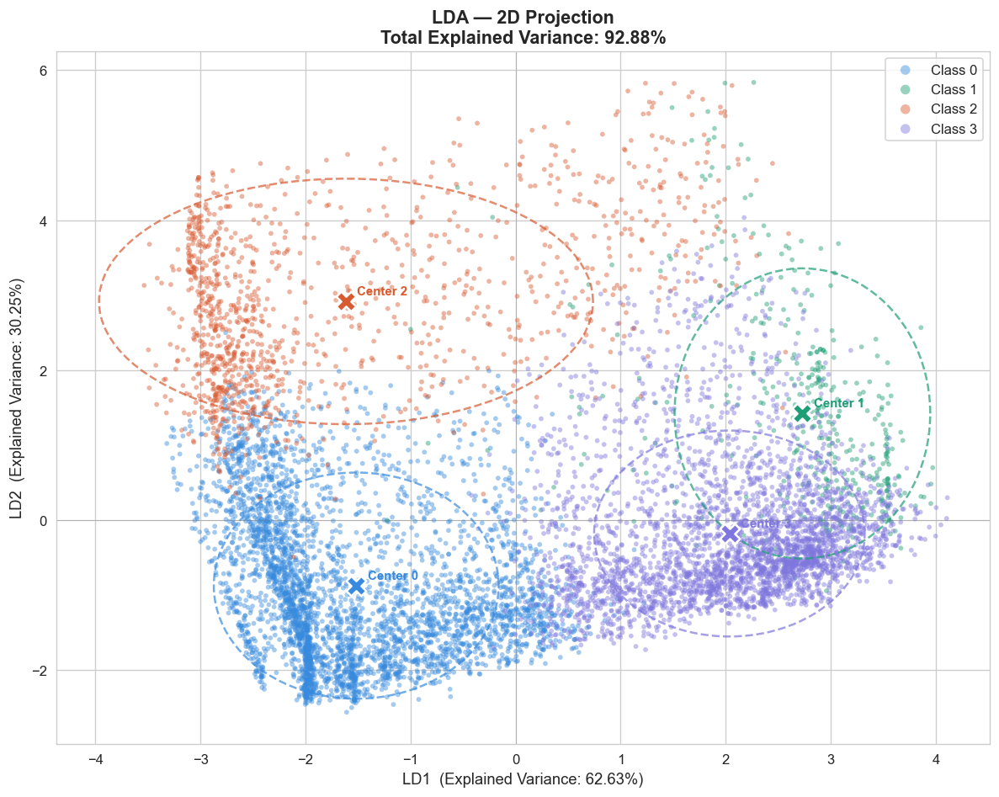

In [51]:
# 6b -----------------------------------------------------------------------
# LDA Scatter Plot
# --------------------------------------------------------------------------

var_ld1 = lda.explained_variance_ratio_[0] * 100
var_ld2 = lda.explained_variance_ratio_[1] * 100

fig, ax = plt.subplots(figsize=(10, 8))

for cls in classes:
    mask = y == cls
    ax.scatter(
        X_lda2d[mask, 0],
        X_lda2d[mask, 1],
        c=CLASS_COLORS[cls],
        label=CLASS_LABELS[cls],
        alpha=0.45,
        s=12,
        edgecolors='none'
    )

# Class centers + ellipses
for cls in classes:
    mask  = y == cls
    cx    = X_lda2d[mask, 0].mean()
    cy    = X_lda2d[mask, 1].mean()
    sx    = X_lda2d[mask, 0].std()
    sy    = X_lda2d[mask, 1].std()

    ax.scatter(cx, cy, c=CLASS_COLORS[cls], s=200,
               marker='X', edgecolors='white', linewidth=1.5, zorder=5)
    ax.annotate(f'Center {cls}', (cx, cy),
                textcoords='offset points', xytext=(8, 5),
                fontsize=9, fontweight='bold', color=CLASS_COLORS[cls])

    theta     = np.linspace(0, 2 * np.pi, 100)
    ellipse_x = cx + 1.5 * sx * np.cos(theta)
    ellipse_y = cy + 1.5 * sy * np.sin(theta)
    ax.plot(ellipse_x, ellipse_y, color=CLASS_COLORS[cls],
            linewidth=1.5, alpha=0.7, linestyle='--')

ax.set_xlabel(f'LD1  (Explained Variance: {var_ld1:.2f}%)', fontsize=11)
ax.set_ylabel(f'LD2  (Explained Variance: {var_ld2:.2f}%)', fontsize=11)
ax.set_title(
    f'LDA — 2D Projection\nTotal Explained Variance: {var_ld1+var_ld2:.2f}%',
    fontweight='bold', fontsize=13
)
ax.axhline(0, color='gray', linewidth=0.5, alpha=0.4)
ax.axvline(0, color='gray', linewidth=0.5, alpha=0.4)
ax.legend(fontsize=10, markerscale=2)
plt.tight_layout()
plt.savefig('lda_scatter.png', bbox_inches='tight')
plt.show()

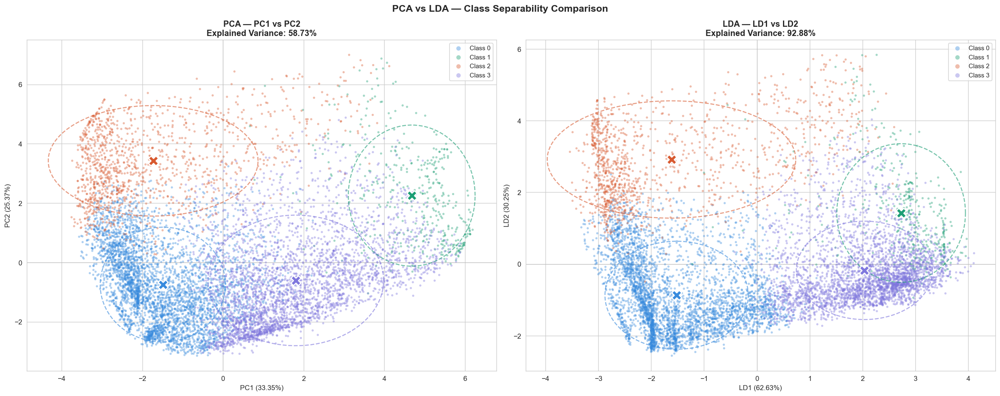

In [52]:
# 6c -----------------------------------------------------------------------
# PCA (PC1 vs PC2) and LDA Side-by-Side Comparison
# --------------------------------------------------------------------------

var_pc1 = pca.explained_variance_ratio_[0] * 100
var_pc2 = pca.explained_variance_ratio_[1] * 100

fig, axes = plt.subplots(1, 2, figsize=(20, 8))

datasets = [
    (X_pca2d,  f'PCA — PC1 vs PC2\nExplained Variance: {var_pc1+var_pc2:.2f}%',
     f'PC1 ({var_pc1:.2f}%)', f'PC2 ({var_pc2:.2f}%)'),
    (X_lda2d,  f'LDA — LD1 vs LD2\nExplained Variance: {var_ld1+var_ld2:.2f}%',
     f'LD1 ({var_ld1:.2f}%)', f'LD2 ({var_ld2:.2f}%)')
]

for ax_idx, (X_2d, title, xlabel, ylabel) in enumerate(datasets):
    ax = axes[ax_idx]

    for cls in classes:
        mask = y == cls
        ax.scatter(X_2d[mask, 0], X_2d[mask, 1],
                   c=CLASS_COLORS[cls], label=CLASS_LABELS[cls],
                   alpha=0.4, s=10, edgecolors='none')

    for cls in classes:
        mask = y == cls
        cx   = X_2d[mask, 0].mean()
        cy   = X_2d[mask, 1].mean()
        sx   = X_2d[mask, 0].std()
        sy   = X_2d[mask, 1].std()

        ax.scatter(cx, cy, c=CLASS_COLORS[cls], s=200,
                   marker='X', edgecolors='white', linewidth=1.5, zorder=5)

        theta     = np.linspace(0, 2 * np.pi, 100)
        ellipse_x = cx + 1.5 * sx * np.cos(theta)
        ellipse_y = cy + 1.5 * sy * np.sin(theta)
        ax.plot(ellipse_x, ellipse_y, color=CLASS_COLORS[cls],
                linewidth=1.5, alpha=0.6, linestyle='--')

    ax.set_title(title, fontweight='bold', fontsize=12)
    ax.set_xlabel(xlabel, fontsize=10)
    ax.set_ylabel(ylabel, fontsize=10)
    ax.axhline(0, color='gray', linewidth=0.4, alpha=0.4)
    ax.axvline(0, color='gray', linewidth=0.4, alpha=0.4)
    ax.legend(fontsize=9, markerscale=2)

plt.suptitle('PCA vs LDA — Class Separability Comparison',
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('pca_vs_lda_comparison.png', bbox_inches='tight')
plt.show()

In [53]:
# 6d -----------------------------------------------------------------------
# BONUS — Evaluation of Class Separability with Numerical Metrics
#
# We use 3 metrics:
#   1. Silhouette Score   -> [-1, 1]  high = good separation
#   2. Fisher Criterion   -> [0, ∞)   high = good separation
#   3. Average Distance Between Class Centers
# --------------------------------------------------------------------------

# --- 1. Silhouette Score ---
sil_pca = silhouette_score(X_pca2d, y)
sil_lda = silhouette_score(X_lda2d, y)

# --- 2. Fisher Criterion (Multi-class) ---
def multiclass_fisher(X_2d, labels):
    classes      = np.unique(labels)
    overall_mean = X_2d.mean(axis=0)
    S_B          = np.zeros((2, 2))   # Between-class scatter matrix
    S_W          = np.zeros((2, 2))   # Within-class scatter matrix

    for cls in classes:
        X_c  = X_2d[labels == cls]
        n_c  = len(X_c)
        mu_c = X_c.mean(axis=0)
        diff = (mu_c - overall_mean).reshape(-1, 1)
        S_B += n_c * (diff @ diff.T)
        for x in X_c:
            d = (x - mu_c).reshape(-1, 1)
            S_W += d @ d.T

    # Fisher Criterion: trace(S_W^-1 * S_B)
    try:
        fisher_val = np.trace(np.linalg.inv(S_W) @ S_B)
    except np.linalg.LinAlgError:
        fisher_val = np.trace(np.linalg.pinv(S_W) @ S_B)
    return fisher_val

fisher_pca = multiclass_fisher(X_pca2d, y)
fisher_lda = multiclass_fisher(X_lda2d, y)

# --- 3. Average Class Center Distance ---
def avg_center_distance(X_2d, labels):
    classes = np.unique(labels)
    centers = {cls: X_2d[labels == cls].mean(axis=0) for cls in classes}
    dists   = [np.linalg.norm(centers[c1] - centers[c2])
               for c1, c2 in combinations(classes, 2)]
    return np.mean(dists)

dist_pca = avg_center_distance(X_pca2d, y)
dist_lda = avg_center_distance(X_lda2d, y)

# --- Results Table ---
metric_df = pd.DataFrame({
    'Metric': [
        'Silhouette Score  (higher = better)',
        'Fisher Criterion   (higher = better)',
        'Avg Center Distance (higher = better)'
    ],
    'PCA (PC1-PC2)': [
        round(sil_pca, 4),
        round(fisher_pca, 4),
        round(dist_pca, 4)
    ],
    'LDA (LD1-LD2)': [
        round(sil_lda, 4),
        round(fisher_lda, 4),
        round(dist_lda, 4)
    ]
})
metric_df['Winner'] = metric_df.apply(
    lambda row: 'LDA ✓' if row['LDA (LD1-LD2)'] > row['PCA (PC1-PC2)']
                else 'PCA ✓', axis=1
)

print('=== BONUS — Class Separability Metric Comparison ===')
print(metric_df.to_string(index=False))

=== BONUS — Class Separability Metric Comparison ===
                               Metric  PCA (PC1-PC2)  LDA (LD1-LD2) Winner
  Silhouette Score  (higher = better)         0.2866         0.3677  LDA ✓
 Fisher Criterion   (higher = better)         3.3562         4.8538  LDA ✓
Avg Center Distance (higher = better)         5.0455         3.8940  PCA ✓


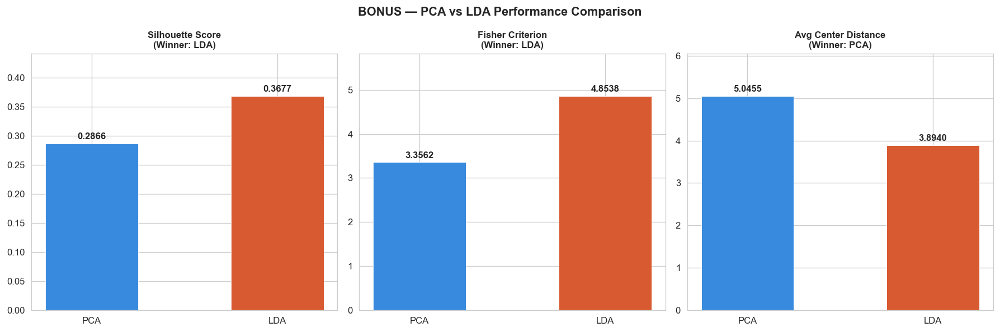

In [54]:
# 6d — Metric Comparison Bar Chart
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

metrics     = ['Silhouette Score', 'Fisher Criterion', 'Avg Center Distance']
pca_vals    = [sil_pca, fisher_pca, dist_pca]
lda_vals    = [sil_lda, fisher_lda, dist_lda]

for idx, (metric, pv, lv) in enumerate(zip(metrics, pca_vals, lda_vals)):
    ax = axes[idx]
    bars = ax.bar(['PCA', 'LDA'], [pv, lv],
                  color=['#378ADD', '#D85A30'],
                  edgecolor='white', linewidth=0.5, width=0.5)
    for bar, val in zip(bars, [pv, lv]):
        ax.text(bar.get_x() + bar.get_width() / 2,
                bar.get_height() + max(pv, lv) * 0.02,
                f'{val:.4f}', ha='center', fontsize=10, fontweight='bold')

    winner = 'LDA' if lv > pv else 'PCA'
    ax.set_title(f'{metric}\n(Winner: {winner})',
                 fontweight='bold', fontsize=10)
    ax.set_ylim(0, max(pv, lv) * 1.2)

plt.suptitle('BONUS — PCA vs LDA Performance Comparison',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('pca_vs_lda_metrics.png', bbox_inches='tight')
plt.show()

In [55]:
###### COMMENTS ON THE RESULTS ######

### LDA outperforms PCA in two out of three metrics: Silhouette Score and
### Fisher Criterion, indicating that LDA produces tighter, better-separated
### clusters. PCA achieves a higher Avg Center Distance because it preserves
### more total variance, spreading class centers further apart in absolute
### terms — but this reflects scale rather than separation quality.
### Overall, LDA yields superior class separability, which is expected:
### as a supervised method, LDA directly optimizes between-class variance
### while minimizing within-class variance, whereas PCA is unsupervised
### and does not account for class labels during the transformation.

######

In [56]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, DBSCAN
from sklearn.manifold import TSNE
from sklearn.neighbors import NearestNeighbors
from minisom import MiniSom

df_clean = pd.read_csv('cc_cleaned.csv')
FEATURES = [c for c in df_clean.columns if c != 'CLASS']
y        = df_clean['CLASS'].values

scaler   = StandardScaler()
X_scaled = scaler.fit_transform(df_clean[FEATURES])

# PCA — PC1 and PC2 (for K-Means and DBSCAN)
pca      = PCA(n_components=2, random_state=42)
X_pca2d  = pca.fit_transform(X_scaled)

CLASS_COLORS = ['#378ADD', '#1D9E75', '#D85A30', '#7F77DD']
CLASS_LABELS = ['Class 0', 'Class 1', 'Class 2', 'Class 3']
classes      = sorted(np.unique(y))

print('Data is ready.')
print(f'PCA (PC1-PC2) shape : {X_pca2d.shape}')
print(f'Original data shape : {X_scaled.shape}')

Data is ready.
PCA (PC1-PC2) shape : (8950, 2)
Original data shape : (8950, 17)


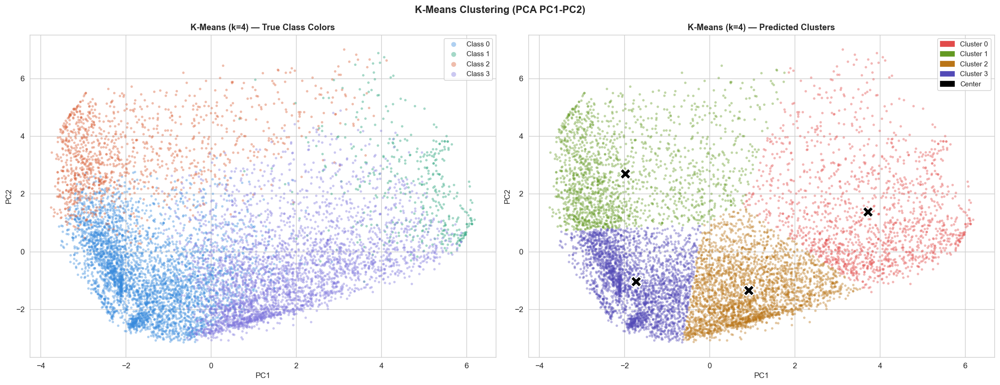

K-Means cluster sizes:
  Cluster 0: 1546 samples
  Cluster 1: 1723 samples
  Cluster 2: 2841 samples
  Cluster 3: 2840 samples


In [57]:
# 7a -----------------------------------------------------------------------
# K-Means Clustering — On PCA PC1-PC2
# K-Means assigns points based on their distance to k centers.
# Since we determined k=4 in Step 0, we use k=4 here as well.
# --------------------------------------------------------------------------

kmeans    = KMeans(n_clusters=4, random_state=42, n_init=10)
km_labels = kmeans.fit_predict(X_pca2d)

fig, axes = plt.subplots(1, 2, figsize=(18, 7))

# Left — with true class labels
for cls in classes:
    mask = y == cls
    axes[0].scatter(X_pca2d[mask, 0], X_pca2d[mask, 1],
                    c=CLASS_COLORS[cls], label=CLASS_LABELS[cls],
                    alpha=0.4, s=10, edgecolors='none')
axes[0].set_title('K-Means (k=4) — True Class Colors',
                  fontweight='bold', fontsize=11)
axes[0].set_xlabel('PC1')
axes[0].set_ylabel('PC2')
axes[0].legend(fontsize=9, markerscale=2)

# Right — with K-Means cluster labels
km_colors  = ['#E24B4A', '#639922', '#BA7517', '#534AB7']
km_handles = []
for km_cls in range(4):
    mask = km_labels == km_cls
    axes[1].scatter(X_pca2d[mask, 0], X_pca2d[mask, 1],
                    c=km_colors[km_cls], label=f'Cluster {km_cls}',
                    alpha=0.4, s=10, edgecolors='none')
    km_handles.append(mpatches.Patch(color=km_colors[km_cls],
                                     label=f'Cluster {km_cls}'))

# Cluster centers
centers = kmeans.cluster_centers_
axes[1].scatter(centers[:, 0], centers[:, 1],
                c='black', s=200, marker='X',
                edgecolors='white', linewidth=1.5,
                zorder=5, label='Center')
axes[1].set_title('K-Means (k=4) — Predicted Clusters',
                  fontweight='bold', fontsize=11)
axes[1].set_xlabel('PC1')
axes[1].set_ylabel('PC2')
axes[1].legend(handles=km_handles +
               [mpatches.Patch(color='black', label='Center')],
               fontsize=9, markerscale=2)

plt.suptitle('K-Means Clustering (PCA PC1-PC2)',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('kmeans_clustering.png', bbox_inches='tight')
plt.show()

print(f'K-Means cluster sizes:')
for i in range(4):
    print(f'  Cluster {i}: {(km_labels == i).sum()} samples')

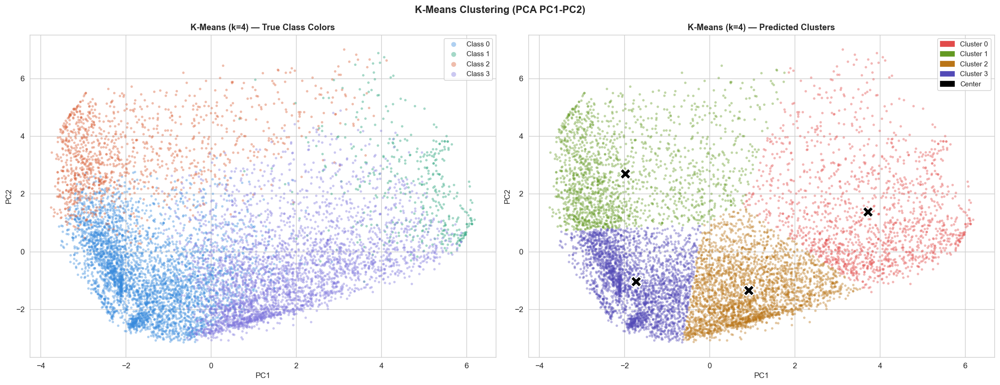

K-Means cluster sizes:
  Cluster 0: 1546 samples
  Cluster 1: 1723 samples
  Cluster 2: 2841 samples
  Cluster 3: 2840 samples


In [58]:
# 7a -----------------------------------------------------------------------
# K-Means Clustering — On PCA PC1-PC2
# K-Means assigns points based on their distance to k centers.
# Since we determined k=4 in Step 0, we use k=4 here as well.
# --------------------------------------------------------------------------

kmeans    = KMeans(n_clusters=4, random_state=42, n_init=10)
km_labels = kmeans.fit_predict(X_pca2d)

fig, axes = plt.subplots(1, 2, figsize=(18, 7))

# Left — with true class labels
for cls in classes:
    mask = y == cls
    axes[0].scatter(X_pca2d[mask, 0], X_pca2d[mask, 1],
                    c=CLASS_COLORS[cls], label=CLASS_LABELS[cls],
                    alpha=0.4, s=10, edgecolors='none')
axes[0].set_title('K-Means (k=4) — True Class Colors',
                  fontweight='bold', fontsize=11)
axes[0].set_xlabel('PC1')
axes[0].set_ylabel('PC2')
axes[0].legend(fontsize=9, markerscale=2)

# Right — with K-Means cluster labels
km_colors  = ['#E24B4A', '#639922', '#BA7517', '#534AB7']
km_handles = []
for km_cls in range(4):
    mask = km_labels == km_cls
    axes[1].scatter(X_pca2d[mask, 0], X_pca2d[mask, 1],
                    c=km_colors[km_cls], label=f'Cluster {km_cls}',
                    alpha=0.4, s=10, edgecolors='none')
    km_handles.append(mpatches.Patch(color=km_colors[km_cls],
                                     label=f'Cluster {km_cls}'))

# Cluster centers
centers = kmeans.cluster_centers_
axes[1].scatter(centers[:, 0], centers[:, 1],
                c='black', s=200, marker='X',
                edgecolors='white', linewidth=1.5,
                zorder=5, label='Center')
axes[1].set_title('K-Means (k=4) — Predicted Clusters',
                  fontweight='bold', fontsize=11)
axes[1].set_xlabel('PC1')
axes[1].set_ylabel('PC2')
axes[1].legend(handles=km_handles +
               [mpatches.Patch(color='black', label='Center')],
               fontsize=9, markerscale=2)

plt.suptitle('K-Means Clustering (PCA PC1-PC2)',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('kmeans_clustering.png', bbox_inches='tight')
plt.show()

print(f'K-Means cluster sizes:')
for i in range(4):
    print(f'  Cluster {i}: {(km_labels == i).sum()} samples')

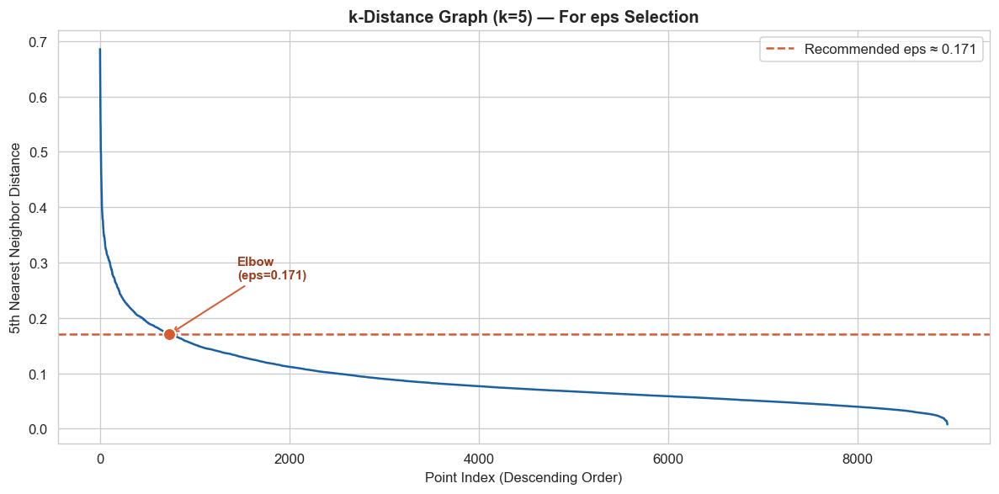

Recommended eps value via geometric elbow detection: 0.171
(Elbow found at point index 733)
Note: If the DBSCAN result is poor, you can try experimenting with an eps slightly below/above this value.


In [59]:
# 7b -----------------------------------------------------------------------
# Determining Optimal eps for DBSCAN — k-Distance Graph
# The distance of each point to its k-nearest neighbor is sorted in descending order.
# The "elbow" point on the curve gives the ideal eps value.
# --------------------------------------------------------------------------

k_neighbors  = 5
nbrs         = NearestNeighbors(n_neighbors=k_neighbors).fit(X_pca2d)
distances, _ = nbrs.kneighbors(X_pca2d)
k_dist       = np.sort(distances[:, k_neighbors - 1])[::-1]   # Descending order

# --- Geometric Elbow (Knee) Detection -------------------------------------
# The point furthest from the line connecting the first and last points = the elbow.
# Since the two axes are on different scales, we first normalize to the [0,1] range.
n      = len(k_dist)
x_norm = np.linspace(0, 1, n)
y_norm = (k_dist - k_dist.min()) / (k_dist.max() - k_dist.min())

# Line: (0, y_norm[0]) → (1, y_norm[-1])
x1, y1 = x_norm[0],  y_norm[0]
x2, y2 = x_norm[-1], y_norm[-1]

# Perpendicular distance of each point to this line
numerator    = np.abs((y2 - y1) * x_norm - (x2 - x1) * y_norm + x2 * y1 - y2 * x1)
denominator  = np.sqrt((y2 - y1) ** 2 + (x2 - x1) ** 2)
dist_to_line = numerator / denominator

elbow_idx = np.argmax(dist_to_line)   # Point furthest from the line = elbow
eps_val   = round(k_dist[elbow_idx], 3)

# --- Plot -----------------------------------------------------------------
fig, ax = plt.subplots(figsize=(10, 5))
ax.plot(k_dist, color='#185FA5', linewidth=1.5)

# Mark the elbow point (both horizontal line and the marker)
ax.axhline(eps_val, color='#D85A30', linestyle='--', linewidth=1.5,
           label=f'Recommended eps ≈ {eps_val}')
ax.scatter([elbow_idx], [k_dist[elbow_idx]], color='#D85A30',
           s=80, zorder=5, edgecolors='white', linewidth=1.2)
ax.annotate(f'Elbow\n(eps={eps_val})',
            xy=(elbow_idx, k_dist[elbow_idx]),
            xytext=(elbow_idx + n * 0.08, k_dist[elbow_idx] + 0.1),
            fontsize=9, fontweight='bold', color='#993C1D',
            arrowprops=dict(arrowstyle='->', color='#D85A30', lw=1.2))

ax.set_title(f'k-Distance Graph (k={k_neighbors}) — For eps Selection',
             fontweight='bold')
ax.set_xlabel('Point Index (Descending Order)')
ax.set_ylabel(f'{k_neighbors}th Nearest Neighbor Distance')
ax.legend()
plt.tight_layout()
plt.show()

print(f'Recommended eps value via geometric elbow detection: {eps_val}')
print(f'(Elbow found at point index {elbow_idx})')
print("Note: If the DBSCAN result is poor, you can try experimenting with an eps slightly below/above this value.")

DBSCAN results:
  Estimated number of clusters : 25
  Number of noise points       : 1299 (14.5%)


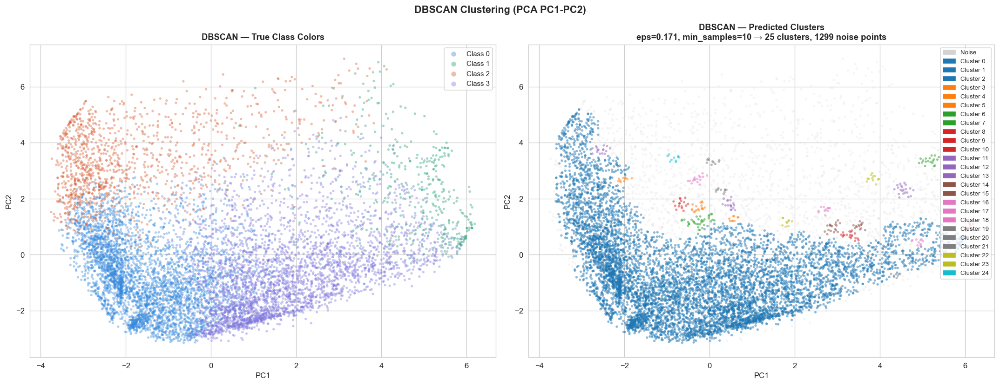

In [60]:
# 7b -----------------------------------------------------------------------
# DBSCAN Clustering — On PCA PC1-PC2
# DBSCAN works based on density; there is no need to specify the number of clusters beforehand.
# Noise points are assigned the label -1.
# --------------------------------------------------------------------------

EPS         = eps_val    # Value derived from the k-distance graph
MIN_SAMPLES = 10

dbscan     = DBSCAN(eps=EPS, min_samples=MIN_SAMPLES)
db_labels  = dbscan.fit_predict(X_pca2d)

n_clusters_db = len(set(db_labels)) - (1 if -1 in db_labels else 0)
n_noise_db    = (db_labels == -1).sum()

print(f'DBSCAN results:')
print(f'  Estimated number of clusters : {n_clusters_db}')
print(f'  Number of noise points       : {n_noise_db} ({n_noise_db/len(db_labels)*100:.1f}%)')

fig, axes = plt.subplots(1, 2, figsize=(18, 7))

# Left — with true class labels
for cls in classes:
    mask = y == cls
    axes[0].scatter(X_pca2d[mask, 0], X_pca2d[mask, 1],
                    c=CLASS_COLORS[cls], label=CLASS_LABELS[cls],
                    alpha=0.4, s=10, edgecolors='none')
axes[0].set_title('DBSCAN — True Class Colors',
                  fontweight='bold', fontsize=11)
axes[0].set_xlabel('PC1')
axes[0].set_ylabel('PC2')
axes[0].legend(fontsize=9, markerscale=2)

# Right — with DBSCAN cluster labels
unique_labels = sorted(set(db_labels))
db_palette    = plt.cm.tab10(np.linspace(0, 0.9, max(n_clusters_db, 1)))
db_handles    = []

for label in unique_labels:
    mask  = db_labels == label
    color = 'lightgray' if label == -1 else db_palette[label % len(db_palette)]
    lname = 'Noise' if label == -1 else f'Cluster {label}'
    axes[1].scatter(X_pca2d[mask, 0], X_pca2d[mask, 1],
                    c=[color], label=lname,
                    alpha=0.5 if label != -1 else 0.2,
                    s=10, edgecolors='none')
    db_handles.append(mpatches.Patch(color=color, label=lname))

axes[1].set_title(
    f'DBSCAN — Predicted Clusters\n'
    f'eps={EPS}, min_samples={MIN_SAMPLES} → {n_clusters_db} clusters, {n_noise_db} noise points',
    fontweight='bold', fontsize=11)
axes[1].set_xlabel('PC1')
axes[1].set_ylabel('PC2')
axes[1].legend(handles=db_handles, fontsize=8, markerscale=2)

plt.suptitle('DBSCAN Clustering (PCA PC1-PC2)',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('dbscan_clustering.png', bbox_inches='tight')
plt.show()

Calculating t-SNE... (this may take 1-2 minutes)
t-SNE completed. KL divergence: 1.3974


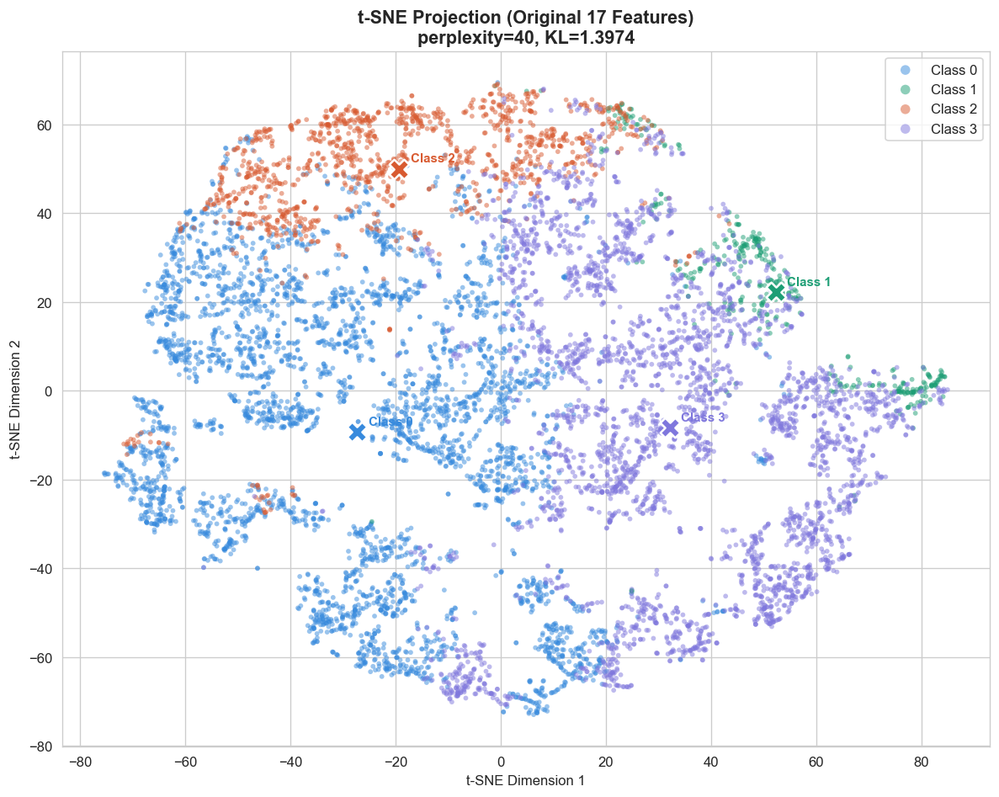

In [61]:
# 7c -----------------------------------------------------------------------
# t-SNE — Original Data (17 features, z-score normalized)
# t-SNE reduces high-dimensional data to 2D for visualization while
# preserving the local neighborhood structure. It is non-deterministic, so random_state is fixed.
# --------------------------------------------------------------------------

print('Calculating t-SNE... (this may take 1-2 minutes)')

tsne      = TSNE(n_components=2, perplexity=40, random_state=42,
                 max_iter=1000, learning_rate='auto', init='pca')
X_tsne    = tsne.fit_transform(X_scaled)

print(f't-SNE completed. KL divergence: {tsne.kl_divergence_:.4f}')

fig, ax = plt.subplots(figsize=(10, 8))

for cls in classes:
    mask = y == cls
    ax.scatter(X_tsne[mask, 0], X_tsne[mask, 1],
               c=CLASS_COLORS[cls], label=CLASS_LABELS[cls],
               alpha=0.5, s=12, edgecolors='none')

# Class centroids
for cls in classes:
    mask = y == cls
    cx   = X_tsne[mask, 0].mean()
    cy   = X_tsne[mask, 1].mean()
    ax.scatter(cx, cy, c=CLASS_COLORS[cls], s=200,
               marker='X', edgecolors='white', linewidth=1.5, zorder=5)
    ax.annotate(f'Class {cls}', (cx, cy),
                textcoords='offset points', xytext=(8, 5),
                fontsize=9, fontweight='bold', color=CLASS_COLORS[cls])

ax.set_title(
    f't-SNE Projection (Original 17 Features)\n'
    f'perplexity=40, KL={tsne.kl_divergence_:.4f}',
    fontweight='bold', fontsize=13
)
ax.set_xlabel('t-SNE Dimension 1')
ax.set_ylabel('t-SNE Dimension 2')
ax.legend(fontsize=10, markerscale=2)
plt.tight_layout()
plt.savefig('tsne_clustering.png', bbox_inches='tight')
plt.show()

SOM grid size: 22 × 22
Training SOM...
SOM training completed.


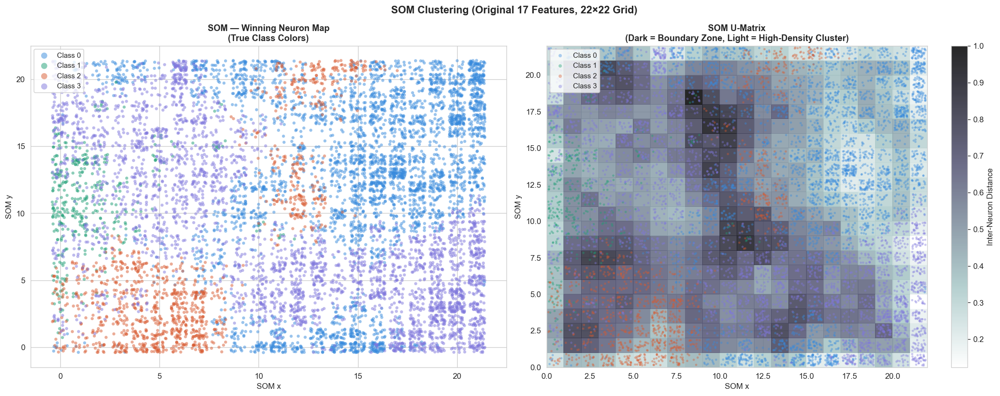

In [62]:
# 7d -----------------------------------------------------------------------
# SOM (Self-Organizing Map) — Original Data (17 features, z-score normalized)
# SOM is a neural network topology; it projects high-dimensional data onto a 2D grid
# and maps similar samples onto neighboring neurons.
# --------------------------------------------------------------------------

# SOM grid size: determined by the rule of √(5 * √n)
grid_size = int(np.ceil(np.sqrt(5 * np.sqrt(len(X_scaled)))))
print(f'SOM grid size: {grid_size} × {grid_size}')

som = MiniSom(
    x=grid_size,
    y=grid_size,
    input_len=X_scaled.shape[1],
    sigma=1.5,
    learning_rate=0.5,
    random_seed=42
)
som.random_weights_init(X_scaled)

print('Training SOM...')
som.train(X_scaled, num_iteration=10000, verbose=False)
print('SOM training completed.')

# Get the winning neuron coordinates for each sample
winner_coords = np.array([som.winner(x) for x in X_scaled])

# Add slight jitter (separate points overlapping on the same neuron)
np.random.seed(42)
jitter = np.random.uniform(-0.4, 0.4, winner_coords.shape)
X_som  = winner_coords + jitter

fig, axes = plt.subplots(1, 2, figsize=(18, 7))

# Left — SOM scatter plot (true class colors)
for cls in classes:
    mask = y == cls
    axes[0].scatter(X_som[mask, 0], X_som[mask, 1],
                    c=CLASS_COLORS[cls], label=CLASS_LABELS[cls],
                    alpha=0.5, s=15, edgecolors='none')

axes[0].set_title('SOM — Winning Neuron Map\n(True Class Colors)',
                  fontweight='bold', fontsize=11)
axes[0].set_xlabel('SOM x')
axes[0].set_ylabel('SOM y')
axes[0].legend(fontsize=9, markerscale=2)

# Right — SOM U-Matrix (inter-neuron distance map)
u_matrix = som.distance_map().T
im = axes[1].pcolor(u_matrix, cmap='bone_r', alpha=0.85)
plt.colorbar(im, ax=axes[1], label='Inter-Neuron Distance')

# Overlay true classes on top of the U-Matrix
for cls in classes:
    mask = y == cls
    axes[1].scatter(
        X_som[mask, 0] + 0.5,
        X_som[mask, 1] + 0.5,
        c=CLASS_COLORS[cls], label=CLASS_LABELS[cls],
        alpha=0.4, s=8, edgecolors='none'
    )

axes[1].set_title('SOM U-Matrix\n(Dark = Boundary Zone, Light = High-Density Cluster)',
                  fontweight='bold', fontsize=11)
axes[1].set_xlabel('SOM x')
axes[1].set_ylabel('SOM y')
axes[1].legend(fontsize=9, markerscale=1.5)

plt.suptitle(f'SOM Clustering (Original 17 Features, {grid_size}×{grid_size} Grid)',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('som_clustering.png', bbox_inches='tight')
plt.show()

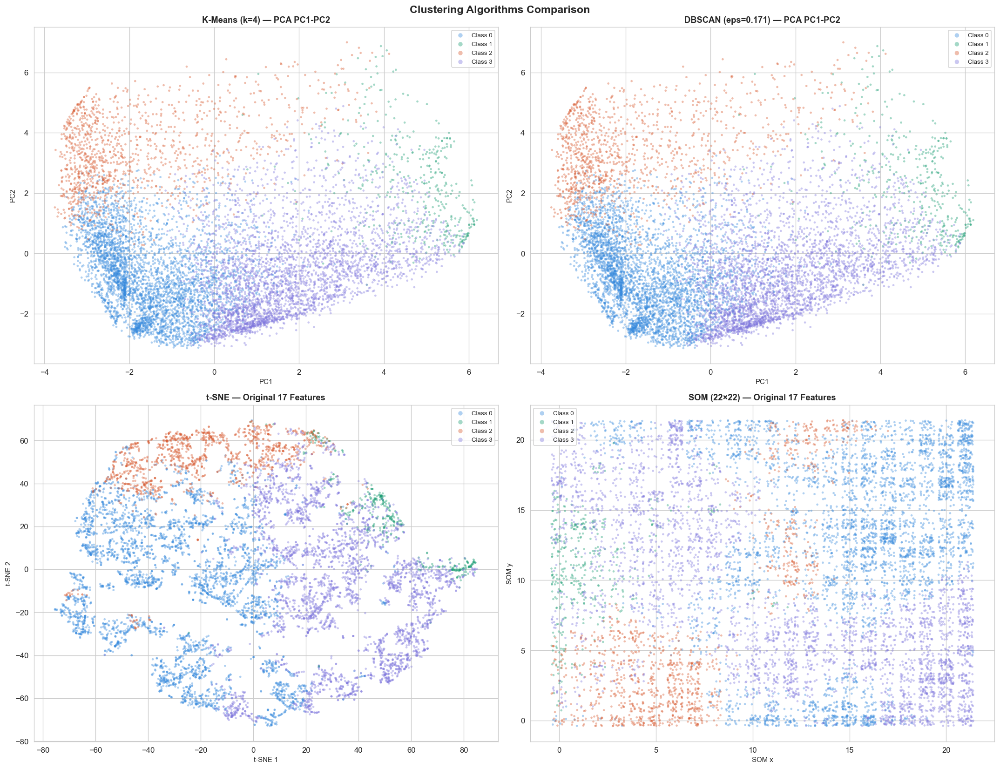

In [63]:
# 7e -----------------------------------------------------------------------
# Side-by-Side Summary Comparison of Four Algorithms
# --------------------------------------------------------------------------

fig, axes = plt.subplots(2, 2, figsize=(18, 14))
axes = axes.flatten()

plot_data = [
    (X_pca2d, km_labels,  'K-Means (k=4) — PCA PC1-PC2',
     'PC1', 'PC2', True),
    (X_pca2d, db_labels,  f'DBSCAN (eps={EPS}) — PCA PC1-PC2',
     'PC1', 'PC2', True),
    (X_tsne,  y,          't-SNE — Original 17 Features',
     't-SNE 1', 't-SNE 2', False),
    (X_som,   y,          f'SOM ({grid_size}×{grid_size}) — Original 17 Features',
     'SOM x', 'SOM y', False),
]

for ax_idx, (X_2d, labels, title, xl, yl, is_cluster) in enumerate(plot_data):
    ax = axes[ax_idx]

    if is_cluster:
        # K-Means / DBSCAN: True class colors
        for cls in classes:
            mask = y == cls
            ax.scatter(X_2d[mask, 0], X_2d[mask, 1],
                       c=CLASS_COLORS[cls], label=CLASS_LABELS[cls],
                       alpha=0.4, s=8, edgecolors='none')
        ax.legend(fontsize=8, markerscale=2)
    else:
        # t-SNE / SOM: True class colors
        for cls in classes:
            mask = labels == cls
            ax.scatter(X_2d[mask, 0], X_2d[mask, 1],
                       c=CLASS_COLORS[cls], label=CLASS_LABELS[cls],
                       alpha=0.4, s=8, edgecolors='none')
        ax.legend(fontsize=8, markerscale=2)

    ax.set_title(title, fontweight='bold', fontsize=11)
    ax.set_xlabel(xl, fontsize=9)
    ax.set_ylabel(yl, fontsize=9)

plt.suptitle('Clustering Algorithms Comparison',
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('clustering_comparison.png', bbox_inches='tight')
plt.show()

In [64]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as stats
from sklearn.preprocessing import StandardScaler

df_clean = pd.read_csv('cc_cleaned.csv')
FEATURES = [c for c in df_clean.columns if c != 'CLASS']

In [65]:
# 8a -----------------------------------------------------------------------
# Feature Selection & Hypothesis Formulation
# Selected Feature : CREDIT_LIMIT
# Rationale        : Obtained one of the highest Fisher Distance values in Step 3
#                    -> A distinct mean difference is expected between classes.
# Compared Classes : Class 0 and Class 2
# (The most prominent behavioral variance in cluster profiles was observed between these two segments.)
# Test Type         : Two-sample independent t-test (two-tailed)
# Sample Sizes      : n = 36 from Class 0, n = 64 from Class 2
# --------------------------------------------------------------------------

FEATURE      = 'CREDIT_LIMIT'
CLASS_A      = 0       # n = 36
CLASS_B      = 2       # n = 64
N_A          = 36
N_B          = 64
ALPHA        = 0.05
RANDOM_STATE = 42

# Data belonging to the selected classes
pop_A = df_clean[df_clean['CLASS'] == CLASS_A][FEATURE]
pop_B = df_clean[df_clean['CLASS'] == CLASS_B][FEATURE]

print(f'Selected feature : {FEATURE}')
print(f'Class {CLASS_A} — Total samples: {len(pop_A)},  Mean: {pop_A.mean():.2f},  Std: {pop_A.std():.2f}')
print(f'Class {CLASS_B} — Total samples: {len(pop_B)},  Mean: {pop_B.mean():.2f},  Std: {pop_B.std():.2f}')

Selected feature : CREDIT_LIMIT
Class 0 — Total samples: 3977,  Mean: 3257.82,  Std: 2554.11
Class 2 — Total samples: 1197,  Mean: 7402.55,  Std: 3419.44


In [66]:
# 8b -----------------------------------------------------------------------
# Random Sampling
# Selecting 36 random samples from Class 0 and 64 random samples from Class 2.
# --------------------------------------------------------------------------

np.random.seed(RANDOM_STATE)

sample_A = pop_A.sample(n=N_A, random_state=RANDOM_STATE).values
sample_B = pop_B.sample(n=N_B, random_state=RANDOM_STATE).values

print(f'Sample A (Class {CLASS_A}, n={N_A}):')
print(f'  Mean    : {sample_A.mean():.4f}')
print(f'  Std     : {sample_A.std():.4f}')
print(f'  Min/Max : {sample_A.min():.2f} / {sample_A.max():.2f}')

print(f'\nSample B (Class {CLASS_B}, n={N_B}):')
print(f'  Mean    : {sample_B.mean():.4f}')
print(f'  Std     : {sample_B.std():.4f}')
print(f'  Min/Max : {sample_B.min():.2f} / {sample_B.max():.2f}')

Sample A (Class 0, n=36):
  Mean    : 3366.6667
  Std     : 2166.5385
  Min/Max : 1000.00 / 9500.00

Sample B (Class 2, n=64):
  Mean    : 7318.7500
  Std     : 3393.5313
  Min/Max : 1700.00 / 13850.00


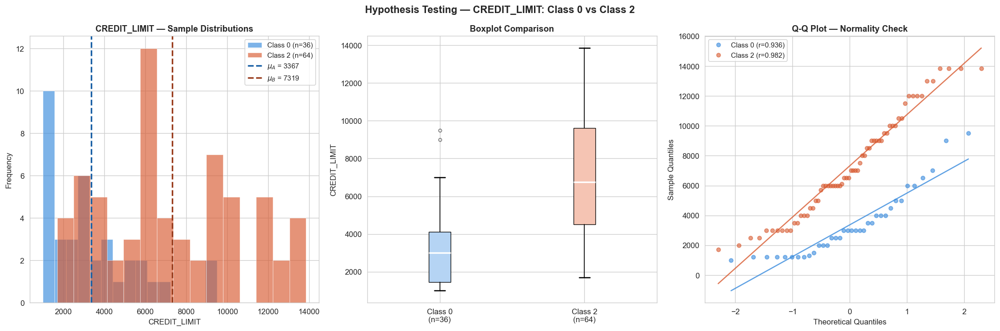

In [67]:
# 8b — Sample Distribution Visualization
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Left — Histogram comparison
axes[0].hist(sample_A, bins=15, alpha=0.65, color='#378ADD',
             edgecolor='white', linewidth=0.5, label=f'Class {CLASS_A} (n={N_A})')
axes[0].hist(sample_B, bins=15, alpha=0.65, color='#D85A30',
             edgecolor='white', linewidth=0.5, label=f'Class {CLASS_B} (n={N_B})')
axes[0].axvline(sample_A.mean(), color='#185FA5', linewidth=2,
                linestyle='--', label=f'$\mu_A$ = {sample_A.mean():.0f}')
axes[0].axvline(sample_B.mean(), color='#993C1D', linewidth=2,
                linestyle='--', label=f'$\mu_B$ = {sample_B.mean():.0f}')
axes[0].set_title(f'{FEATURE} — Sample Distributions',
                  fontweight='bold', fontsize=11)
axes[0].set_xlabel(FEATURE)
axes[0].set_ylabel('Frequency')
axes[0].legend(fontsize=9)

# Center — Boxplot
bp = axes[1].boxplot(
    [sample_A, sample_B],
    patch_artist=True,
    labels=[f'Class {CLASS_A}\n(n={N_A})', f'Class {CLASS_B}\n(n={N_B})'],
    boxprops=dict(linewidth=0.8),
    medianprops=dict(linewidth=2, color='white'),
    whiskerprops=dict(linewidth=1),
    capprops=dict(linewidth=1.5),
    flierprops=dict(marker='o', markersize=4, alpha=0.5)
)
bp['boxes'][0].set_facecolor('#B5D4F4')
bp['boxes'][1].set_facecolor('#F5C4B3')
axes[1].set_title('Boxplot Comparison', fontweight='bold', fontsize=11)
axes[1].set_ylabel(FEATURE)

# Right — Q-Q Plot (normality check)
for i, (sample, color, label) in enumerate([
    (sample_A, '#378ADD', f'Class {CLASS_A}'),
    (sample_B, '#D85A30', f'Class {CLASS_B}')
]):
    (osm, osr), (slope, intercept, r) = stats.probplot(sample, dist='norm')
    axes[2].plot(osm, osr, 'o', color=color, alpha=0.6,
                 markersize=5, label=f'{label} (r={r:.3f})')
    axes[2].plot(osm, slope * np.array(osm) + intercept,
                 '-', color=color, linewidth=1.5, alpha=0.8)

axes[2].set_title('Q-Q Plot — Normality Check', fontweight='bold', fontsize=11)
axes[2].set_xlabel('Theoretical Quantiles')
axes[2].set_ylabel('Sample Quantiles')
axes[2].legend(fontsize=9)

plt.suptitle(f'Hypothesis Testing — {FEATURE}: Class {CLASS_A} vs Class {CLASS_B}',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('hypothesis_test_overview.png', bbox_inches='tight')
plt.show()

In [68]:
###### COMMENTS ON THE RESULTS ######

### The histogram and boxplot clearly show that Class 0 (μ=3367) has a
### lower and narrower CREDIT_LIMIT distribution compared to Class 2
### (μ=7319), which is both higher and more spread out — visually
### confirming the large mean difference detected by the t-test in next cells.
### The Q-Q plots indicate approximate normality for both samples
### (r=0.936 and r=0.982), satisfying the key assumption of the t-test.
### Combined with the sample sizes (n=36 and n=64), the Central Limit
### Theorem further supports the validity of the test results.

######

In [69]:
# 8c -----------------------------------------------------------------------
# Levene's Test — Homogeneity of Variance Check
# To decide which version of the t-test to use,
# we first verify whether the variances of the two groups are equal.
#
# H0: $\sigma^2_A = \sigma^2_B$  (Variances are equal -> equal_var=True  -> Student's t-test)
# H1: $\sigma^2_A \neq \sigma^2_B$  (Variances are different -> equal_var=False -> Welch's t-test)
# --------------------------------------------------------------------------

levene_stat, levene_p = stats.levene(sample_A, sample_B)

print('=== Levene\'s Test for Homogeneity of Variance ===')
print(f'Levene statistic : {levene_stat:.4f}')
print(f'p-value          : {levene_p:.4f}')

if levene_p < ALPHA:
    equal_var = False
    print(f'\np < {ALPHA} -> Variances are NOT EQUAL -> Welch\'s t-test will be applied.')
else:
    equal_var = True
    print(f'\np >= {ALPHA} -> Variances are EQUAL -> Student\'s t-test will be applied.')

=== Levene's Test for Homogeneity of Variance ===
Levene statistic : 10.0631
p-value          : 0.0020

p < 0.05 -> Variances are NOT EQUAL -> Welch's t-test will be applied.


In [70]:
# 8c -----------------------------------------------------------------------
# Two-Sample Independent t-Test
# --------------------------------------------------------------------------

t_stat, p_value = stats.ttest_ind(
    sample_A,
    sample_B,
    equal_var=equal_var,   # Determined by Levene's test
    alternative='two-sided'
)

# Degrees of freedom
if equal_var:
    df_t = N_A + N_B - 2
else:
    # Welch–Satterthwaite approximation
    s_A, s_B = sample_A.var(ddof=1), sample_B.var(ddof=1)
    df_t = (s_A/N_A + s_B/N_B)**2 / \
           ((s_A/N_A)**2/(N_A-1) + (s_B/N_B)**2/(N_B-1))

# Critical value
t_critical = stats.t.ppf(1 - ALPHA/2, df=df_t)

# Effect size — Cohen's d
pooled_std = np.sqrt(((N_A-1)*sample_A.var(ddof=1) +
                      (N_B-1)*sample_B.var(ddof=1)) / (N_A+N_B-2))
cohens_d   = abs(sample_A.mean() - sample_B.mean()) / pooled_std

print('=== t-Test Results ===')
print(f'Test Type          : {"Student" if equal_var else "Welch"}\'s t-test')
print(f't-statistic        : {t_stat:.4f}')
print(f'Degrees of Freedom : {df_t:.2f}')
print(f'Critical Value (α/2): ±{t_critical:.4f}')
print(f'p-value            : {p_value:.6f}')
print(f"Cohen's d          : {cohens_d:.4f}")
print()

if p_value < ALPHA:
    print(f'DECISION: p={p_value:.6f} < α={ALPHA}')
    print(f'-> REJECT H0: The mean {FEATURE} of Class {CLASS_A} and Class {CLASS_B}')
    print('   are STATISTICALLY SIGNIFICANTLY DIFFERENT.')
else:
    print(f'DECISION: p={p_value:.6f} >= α={ALPHA}')
    print(f'-> FAIL TO REJECT H0: There is NO STATISTICALLY SIGNIFICANT')
    print(f'   difference between the mean {FEATURE} of Class {CLASS_A} and Class {CLASS_B}.')

=== t-Test Results ===
Test Type          : Welch's t-test
t-statistic        : -7.0204
Degrees of Freedom : 96.17
Critical Value (α/2): ±1.9849
p-value            : 0.000000
Cohen's d          : 1.2998

DECISION: p=0.000000 < α=0.05
-> REJECT H0: The mean CREDIT_LIMIT of Class 0 and Class 2
   are STATISTICALLY SIGNIFICANTLY DIFFERENT.


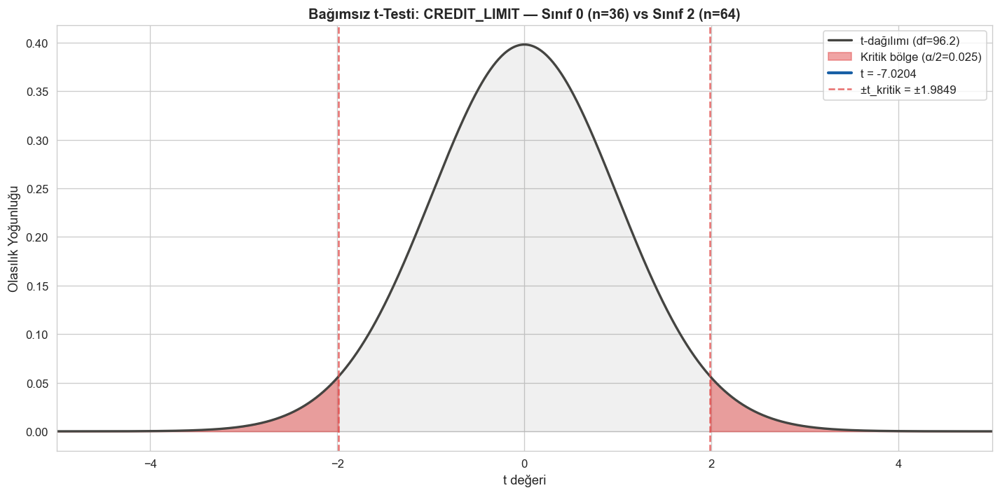

In [71]:
# 8d -----------------------------------------------------------------------
# t-Distribution Visualization
# Shows whether the calculated t-statistic falls within the critical region.
# --------------------------------------------------------------------------

x = np.linspace(-5, 5, 1000)
y_pdf = stats.t.pdf(x, df=df_t)

fig, ax = plt.subplots(figsize=(12, 6))

# t-dağılımı eğrisi
ax.plot(x, y_pdf, color='#444441', linewidth=2, label=f't-dağılımı (df={df_t:.1f})')
ax.fill_between(x, y_pdf, alpha=0.08, color='#444441')

# Kritik bölgeler (kırmızı)
ax.fill_between(x, y_pdf,
                where=(x <= -t_critical),
                color='#E24B4A', alpha=0.5, label=f'Kritik bölge (α/2={ALPHA/2})')
ax.fill_between(x, y_pdf,
                where=(x >= t_critical),
                color='#E24B4A', alpha=0.5)

# Hesaplanan t-istatistiği
ax.axvline(t_stat, color='#185FA5', linewidth=2.5,
           linestyle='-', label=f't = {t_stat:.4f}')
ax.axvline(-t_critical, color='#E24B4A', linewidth=1.5,
           linestyle='--', alpha=0.8, label=f'±t_kritik = ±{t_critical:.4f}')
ax.axvline(t_critical,  color='#E24B4A', linewidth=1.5,
           linestyle='--', alpha=0.8)

# p-değeri göstergesi
ax.annotate(
    f'p = {p_value:.6f}\n{"H₀ REJECTED ✓" if p_value < ALPHA else "H₀ FAIL TO REJECT"}',
    xy=(t_stat, stats.t.pdf(t_stat, df=df_t)),
    xytext=(t_stat + 0.3, max(y_pdf) * 0.6),
    fontsize=10, fontweight='bold',
    color='#185FA5',
    arrowprops=dict(arrowstyle='->', color='#185FA5', lw=1.5)
)

ax.set_title(
    f'Bağımsız t-Testi: {FEATURE} — Sınıf {CLASS_A} (n={N_A}) vs Sınıf {CLASS_B} (n={N_B})',
    fontweight='bold', fontsize=12
)
ax.set_xlabel('t değeri', fontsize=11)
ax.set_ylabel('Olasılık Yoğunluğu', fontsize=11)
ax.legend(fontsize=10)
ax.set_xlim(-5, 5)
plt.tight_layout()
plt.savefig('ttest_distribution.png', bbox_inches='tight')
plt.show()

In [72]:
###### COMMENTS ON THE RESULTS ######

### The t-distribution plot shows that the calculated t-statistic of -7.02
### falls far beyond the left critical boundary of ±1.9849, so far that it
### lies completely outside the visible plot range — indicating an extremely
### strong rejection of H0. The negative sign confirms that Class 0 has a
### significantly lower mean CREDIT_LIMIT than Class 2.
### With such a large |t| value, the p-value is effectively zero, providing
### overwhelming statistical evidence that the two classes differ in their
### average credit limit. This result aligns with the high Fisher Distance
### of CREDIT_LIMIT observed in Step 3, confirming it as a strong
### discriminative feature between customer segments.

######

In [73]:
# 8e -----------------------------------------------------------------------
# Summary Results Table
# --------------------------------------------------------------------------

summary = pd.DataFrame({
    'Parameter': [
        'Selected feature',
        'Compared classes',
        'Sample sizes',
        'Sample A mean',
        'Sample B mean',
        'Mean difference',
        'Test type',
        't-statistic',
        'Degrees of freedom',
        'Critical value (±)',
        'p-value',
        "Cohen's d (effect size)",
        'Significance level (alpha)',
        'Decision'
    ],
    'Value': [
        FEATURE,
        f'Class {CLASS_A} vs Class {CLASS_B}',
        f'n_A={N_A}, n_B={N_B}',
        f'{sample_A.mean():.4f}',
        f'{sample_B.mean():.4f}',
        f'{abs(sample_A.mean() - sample_B.mean()):.4f}',
        "Welch's t-test" if not equal_var else "Student's t-test",
        f'{t_stat:.4f}',
        f'{df_t:.2f}',
        f'±{t_critical:.4f}',
        f'{p_value:.6f}',
        f'{cohens_d:.4f} ({"Large" if cohens_d > 0.8 else "Medium" if cohens_d > 0.5 else "Small"})',
        f'{ALPHA}',
        f'H_0 {"REJECTED ✓" if p_value < ALPHA else "FAIL TO REJECT ✗"}'
    ]
})

print(summary.to_string(index=False))

                 Parameter              Value
          Selected feature       CREDIT_LIMIT
          Compared classes Class 0 vs Class 2
              Sample sizes     n_A=36, n_B=64
             Sample A mean          3366.6667
             Sample B mean          7318.7500
           Mean difference          3952.0833
                 Test type     Welch's t-test
               t-statistic            -7.0204
        Degrees of freedom              96.17
        Critical value (±)            ±1.9849
                   p-value           0.000000
   Cohen's d (effect size)     1.2998 (Large)
Significance level (alpha)               0.05
                  Decision     H_0 REJECTED ✓


In [74]:
###### COMMENTS ON THE RESULTS ######

### Class 0 has a mean CREDIT_LIMIT of ~3367 while Class 2 has ~7319.
### The Welch's t-test confirms that this difference of ~3952 is not due
### to chance (p≈0, H0 rejected). Cohen's d=1.30 indicates a large
### effect size, meaning the difference is both statistically significant
### and practically meaningful. Class 2 customers clearly operate at a
### much higher credit limit than Class 0 customers.

######